# Diamond recognition

## Intro 

My name is Ofir Giat (204623383), young computer science student who is passionate about data science. When i tried to come with idea for a project, i knew i need a real problem from my daily life that i can relate to. I manage to define many problems that would be nice to solve but it was actually very hard to find a way to solve them through deep learning, either the problems were too simple and were not worth the effort to solve them that way, or i couldn't find a satisfying data-set to work with. it was very frustrating. And then one day my wife started to ask me questions about the diamond ring that i bought her. and then i found my self explaining about its properties and how much it worth because of its features. Then I realized, that i don't actually know if the things i say are correct, since you cant really see the differences without having the skills for it. Finally I had the idea that it would be nice if i had a way to tell what are the features of the diamond based on a picture of it.

#### Why is it worth the effort?

Since I am not the only one who finds himself buying a diamond during his life and does not really have the ability to distinguish between the qualities of the diamond and is forced to rely on the credibility of the seller, such a tool can certainly improve the feeling of security during the purchase, and reduce the chance of buying a fake.

## Domain knowledge

The prices of rough diamonds are determined according to the various sorting categories that relate to shape, size, color and cleanliness. The prices of the polished diamonds are also determined by the quality of the polishing.

The clarity level of the diamond, known in the commercial jargon as clarity, refers to the defects and inclusions of the diamond - inside it and on its surface. The clarity score of the diamond will be determined according to the type of inclusions or defects, their size, location, visibility, etc.

**Clarity scale in descending order**:  FL, IF, VVS1, VVS2, VS1, VS2, SI1, SI2, SI3, I1, I2, I3, I4, I5, I6, I7.

It is customary to divide diamonds into two main groups - normal colors and special colors (colored diamonds). Each group has its own rating scale.
The letter D indicates a completely colorless diamond. As you go up the grade of letters, the color of the diamond is more yellowish.
The colors of colored diamonds, or by their commercial name Fancy color diamonds, are measured in a completely different way when the most important criterion is the intensity of the color of the diamond.

The cut of a diamond significantly affects its brilliance and overall appearance. The cut grading system categorizes diamond cuts into the following categories:
- Excellent - EX
- Very Good - VG
-  Good - G/GD
-  Fair -F/FR
-  Poor - PR

Another index that affects the price of a diamond and its perceived quality is the diamond fluorescence index. Many diamonds emit a bluish light when placed under a UV lamp (which emits ultraviolet rays). For colorless diamonds, high fluorescence is considered to be what creates a frosty appearance and therefore cheapens them. For yellowish diamonds, high fluorescence is a positive thing because it whitens them.

**Fluorescence scale in descending order**:
- NONE
- Very Faint
- Faint
- Very Sligh
- Slight
- Medium
- Strong
- Very Strong.

A carat is a unit of weight of gemstones, and is exactly equal to 200 milligrams.
The carat is divided into 100 points, each weighing 2 milligrams.

### A Bit About The Data

I found this data at kaggle.com/datasets/aayushpurswani/diamond-images-dataset.
The image data is scraped from https://capitalwholesalediamonds.com, featuring predominantly GIA-certified diamonds.
I tried to use tensorflow and keras at the begining, but found that pytorch gave me better results.

## EDA

#### Let's start exploring the data !!!

In [17]:
import pandas as pd
import os

csv_file='diamond_data.csv'
root_dir='web_scraped'
dataframe = pd.read_csv(os.path.join(root_dir, csv_file))

In [18]:
# Check directory structure and load the labels
dataset_labels = os.listdir(root_dir)
print("Classes:", dataset_labels)

Classes: ['cushion', 'diamond_data.csv', 'emerald', 'heart', 'marquise', 'oval', 'pear', 'princess', 'round']


as we can see the data is divided to classes based on the images shapes and we have the diamond_data csv that contains all the details of the images.
lets take a look at the csv structure.

In [19]:
dataframe.head()

,path_to_img,stock_number,shape,carat,clarity,colour,cut,polish,symmetry,fluorescence,lab,length,width,depth
0,web_scraped/cushion/2106452.jpg,2106452,cushion,0.55,SI2,N,VG,EX,VG,N,GIA,4.56,4.44,3.09
1,web_scraped/cushion/2042329.jpg,2042329,cushion,0.52,SI2,Y-Z,EX,EX,VG,F,GIA,4.40,4.31,2.99
2,web_scraped/cushion/2055268.jpg,2055268,cushion,0.50,SI1,L,VG,EX,VG,N,GIA,4.87,4.19,2.89
3,web_scraped/cushion/2128779.jpg,2128779,cushion,0.50,VS2,M,EX,EX,VG,F,GIA,4.73,4.28,2.84
4,web_scraped/cushion/2103991.jpg,2103991,cushion,0.51,SI1,M,EX,EX,VG,N,GIA,4.47,4.44,3.05


The csv contains 13 features but the stock_number and the lab are definitely irrelevant, lets discard them.

In [20]:
dataframe = dataframe.drop(columns=['stock_number', 'lab'])

Now we can take a deeper look at the data

In [21]:
print(dataframe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48764 entries, 0 to 48763
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   path_to_img   48764 non-null  object 
 1   shape         48764 non-null  object 
 2   carat         48764 non-null  float64
 3   clarity       48726 non-null  object 
 4   colour        48764 non-null  object 
 5   cut           47749 non-null  object 
 6   polish        48762 non-null  object 
 7   symmetry      48762 non-null  object 
 8   fluorescence  48764 non-null  object 
 9   length        48764 non-null  float64
 10  width         48764 non-null  float64
 11  depth         48764 non-null  float64
dtypes: float64(4), object(8)
memory usage: 4.5+ MB
None


There are 48764 images in the data but there are features that have null values.

Lets see which one and how many they are.

In [22]:
print(dataframe.isnull().sum())

path_to_img        0
shape              0
carat              0
clarity           38
colour             0
cut             1015
polish             2
symmetry           2
fluorescence       0
length             0
width              0
depth              0
dtype: int64


According to this most of the data is valid, but we need to consider if we should discard the images with insuffisante value.
We will try to see the distribution of the values ​​according to the shape class.

In [23]:
df_with_nulls = dataframe[dataframe.isnull().any(axis=1)]

In [24]:
value_counts = df_with_nulls['shape'].value_counts()
print(value_counts)

shape
pear        985
cushion      23
marquise     22
oval         12
emerald       9
heart         1
round         1
Name: count, dtype: int64


In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_distribution(data ,column ,title ,xlabel, ylabel):
    # Plot shape distribution
    plt.figure(figsize=(12, 5))
    sns.histplot(data[column])
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

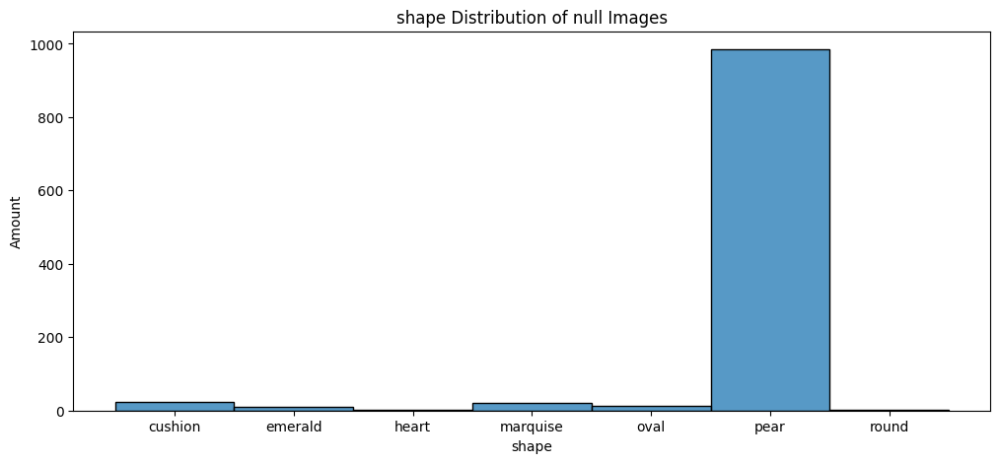

In [26]:
plot_distribution(df_with_nulls,'shape', 'shape Distribution of null Images','shape','Amount')

As we can see most of the null values belong to the pear shape.

In [27]:
value_counts = dataframe['shape'].value_counts()
print(value_counts)

shape
round       21032
oval         6492
cushion      5341
pear         4338
princess     3949
heart        3756
emerald      3391
marquise      465
Name: count, dtype: int64


The amount of the null images belong to each shape is negligible except the pear shape which constitutes about 22% of the pear data.
We will need to consider if we can drop them, for now I would prefer to remove them because it will be more convenient to work that way and if the need arises we will deal with them later.

In [28]:
dataframe = dataframe.dropna()
dataframe = dataframe.reset_index(drop=True)

Now we will go over the data and see the types of possible values, we will check their uniformity for a certain form of presentation and explain a little about the differences, and if necessary, we will convert from strings to numbers in order to obtain a hierarchical order of the values.

In [29]:
shape_unique_samples = dataframe.drop_duplicates(subset=['shape'])
carat_unique_samples = dataframe.drop_duplicates(subset=['carat'])
clarity_unique_samples = dataframe.drop_duplicates(subset=['clarity'])
colour_unique_samples = dataframe.drop_duplicates(subset=['colour'])
cut_unique_samples = dataframe.drop_duplicates(subset=['cut'])
polish_unique_samples = dataframe.drop_duplicates(subset=['polish'])
symmetry_unique_samples = dataframe.drop_duplicates(subset=['symmetry'])
fluorescence_unique_samples = dataframe.drop_duplicates(subset=['fluorescence'])
length_unique_samples = dataframe.drop_duplicates(subset=['length'])
width_unique_samples = dataframe.drop_duplicates(subset=['width'])
depth_unique_samples = dataframe.drop_duplicates(subset=['depth'])

In [30]:
shape_unique_samples = shape_unique_samples[['path_to_img','shape']]
carat_unique_samples = carat_unique_samples[['path_to_img','carat']]
clarity_unique_samples = clarity_unique_samples[['path_to_img','clarity']]
colour_unique_samples = colour_unique_samples[['path_to_img','colour']]
cut_unique_samples = cut_unique_samples[['path_to_img','cut']]
polish_unique_samples = polish_unique_samples[['path_to_img','polish']]
symmetry_unique_samples = symmetry_unique_samples[['path_to_img','symmetry']]
fluorescence_unique_samples = fluorescence_unique_samples[['path_to_img','fluorescence']]
length_unique_samples = length_unique_samples[['path_to_img','length']]
width_unique_samples = width_unique_samples[['path_to_img','width']]
depth_unique_samples = depth_unique_samples[['path_to_img','depth']]

In [31]:
import numpy as np
from PIL import Image

def plot_diamonds(data_frame, image_title_column, images_in_row = 10):
    # Parameters
    total_images = len(data_frame)
    desired_rows = int(total_images / images_in_row)
    if total_images % images_in_row :
        desired_rows = desired_rows + 1 
    
    # Calculate the number of columns
    num_columns = int(np.ceil(total_images / desired_rows))
    
    # Plot images
    fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
    axes = axes.flatten()  # Flatten the array of axes for easy iteration
    
    # Display images
    for i in range(total_images):
        img_path = data_frame.iloc[i]['path_to_img']
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')  # Hide axis
        axes[i].set_title(f'{data_frame.iloc[i][image_title_column]}')
    
    # Hide any unused axes
    for ax in axes[total_images:]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

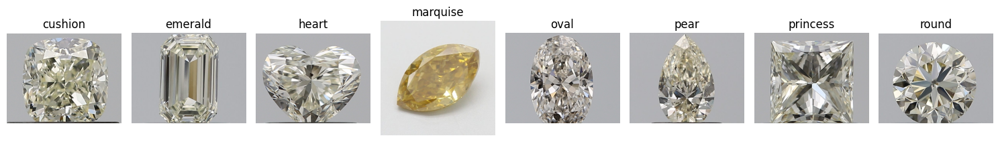

In [32]:
plot_diamonds(shape_unique_samples, 'shape')

Here we can see the eight types of shapes we will work with: cushion, emerald, heart, marquise, oval, pear, princess and round.

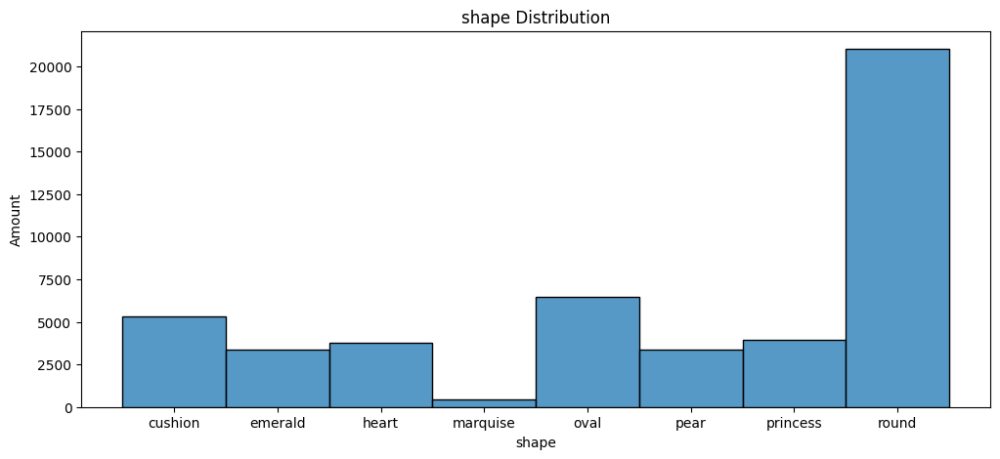

In [33]:
plot_distribution(dataframe,'shape', 'shape Distribution','shape','Amount')

Most of the shapes has between 3000 to 5000 images except the marquise shape with less than a 1000 and the round shape with more than 20000.
We need to figure out how that affect our classification.

In [34]:
clarity_unique_samples = clarity_unique_samples.sort_values(by='clarity', ascending=True)
print(clarity_unique_samples['clarity'])

7746       FL
760        I1
119        I2
42698      I3
42127      I4
36697      I5
35497      I6
34353      I7
365        IF
2         SI1
0         SI2
44724    SI2-
43606     SI3
7         VS1
3         VS2
22       VVS1
57       VVS2
Name: clarity, dtype: object


The image number 45777 has a value of "SI2-" which is incorrect and supposed to be "SI2", we will fix that.

In [35]:
dataframe['clarity'] = dataframe['clarity'].replace('SI2-', 'SI2')
clarity_unique_samples = dataframe.drop_duplicates(subset=['clarity'])
clarity_unique_samples = clarity_unique_samples[['path_to_img','clarity']]
clarity_unique_samples = clarity_unique_samples.sort_values(by='clarity', ascending=True)

In [36]:
# Define the custom order
custom_order = ['FL','IF','VVS1','VVS2','VS1','VS2','SI1','SI2','SI3','I1','I2','I3','I4','I5','I6','I7']

# Convert the 'Name' column to a categorical type with the custom order
clarity_unique_samples['clarity'] = pd.Categorical(clarity_unique_samples['clarity'], categories=custom_order, ordered=True)

# Sort the DataFrame by the custom order
df_sorted = clarity_unique_samples.sort_values(by='clarity')

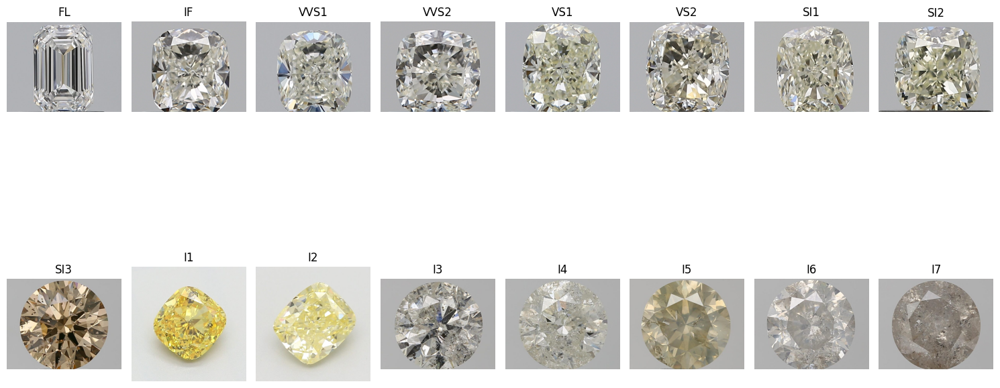

In [37]:
plot_diamonds(df_sorted, 'clarity')

**Clarity scale in descending order**:FL,IF,VVS1,VVS2,VS1,VS2,SI1,SI2,SI3,I1,I2,I3,I4,I5,I6,I7.

Here we can see that the more we go up in the clarity level, the less cloudy the diamond looks.

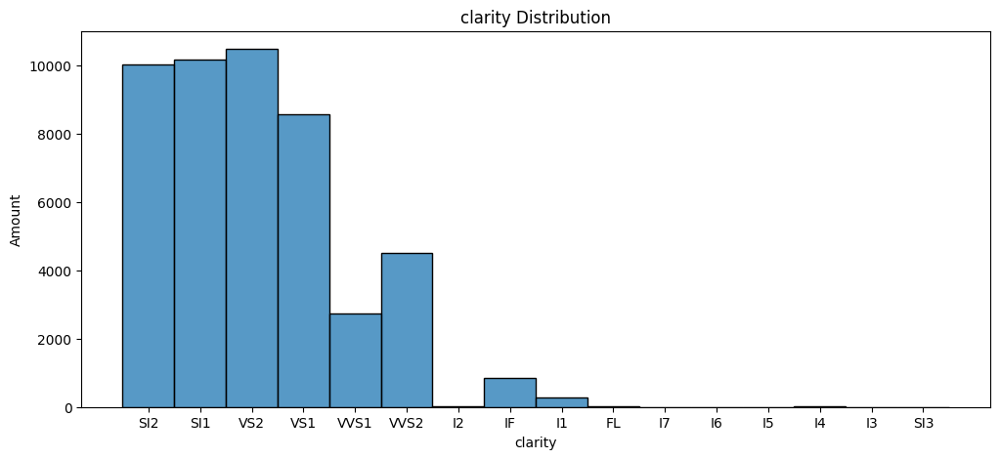

In [38]:
plot_distribution(dataframe,'clarity', 'clarity Distribution','clarity','Amount')

Most of our images contains the **VVS1, VVS2, VS1, VS2, SI1, SI2** clarity rating and barely any of the rest.

In [39]:
colour_unique_samples = colour_unique_samples.sort_values(by='colour', ascending=True)
print(colour_unique_samples['colour'])

258           D
34615    D:P:BN
173           E
270           F
33        FANCY
33555      FC:P
75            G
94            H
77            I
37549       I:P
21            J
5             K
2             L
3             M
0             N
2072        O-P
4112        Q-R
14          S-T
16          U-V
15          W-X
1           Y-Z
Name: colour, dtype: object


Diamonds beyond the Z grade enter the realm of fancy colors, which are graded differently and include vivid hues of yellow, brown, pink, blue, green, and other colors. Fancy color diamonds are graded based on the intensity and hue of their color rather than the absence of color.

Most of our data does not differentiate between the colors of the FANCY category except for the following three cases: "D:P:BN","FC:P", "I:P", so we will add them to the FANCY category. 

In [40]:
dataframe['colour'] = dataframe['colour'].replace('D:P:BN', 'FANCY')
dataframe['colour'] = dataframe['colour'].replace('FC:P', 'FANCY')
dataframe['colour'] = dataframe['colour'].replace('I:P', 'FANCY')

In [41]:
colour_unique_samples = dataframe.drop_duplicates(subset=['colour'])
colour_unique_samples = colour_unique_samples[['path_to_img','colour']]
colour_unique_samples = colour_unique_samples.sort_values(by='colour', ascending=True)

In [42]:
print(colour_unique_samples['colour'])

258         D
173         E
270         F
33      FANCY
75          G
94          H
77          I
21          J
5           K
2           L
3           M
0           N
2072      O-P
4112      Q-R
14        S-T
16        U-V
15        W-X
1         Y-Z
Name: colour, dtype: object


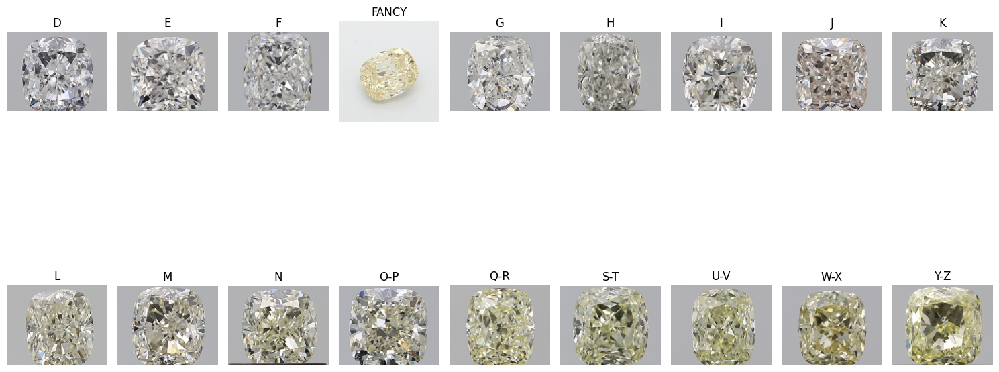

In [43]:
plot_diamonds(colour_unique_samples, 'colour')

We can see in the above pictures how the colour turns from Absolutely colorless to Light yellow or brown tint as the letters goes up.
Except the FANCY colour which is still yellowish, but a bit different from the rest.

In [44]:
fancy_df = dataframe[dataframe['colour'] == 'FANCY']
random_rows = fancy_df.sample(n=30)

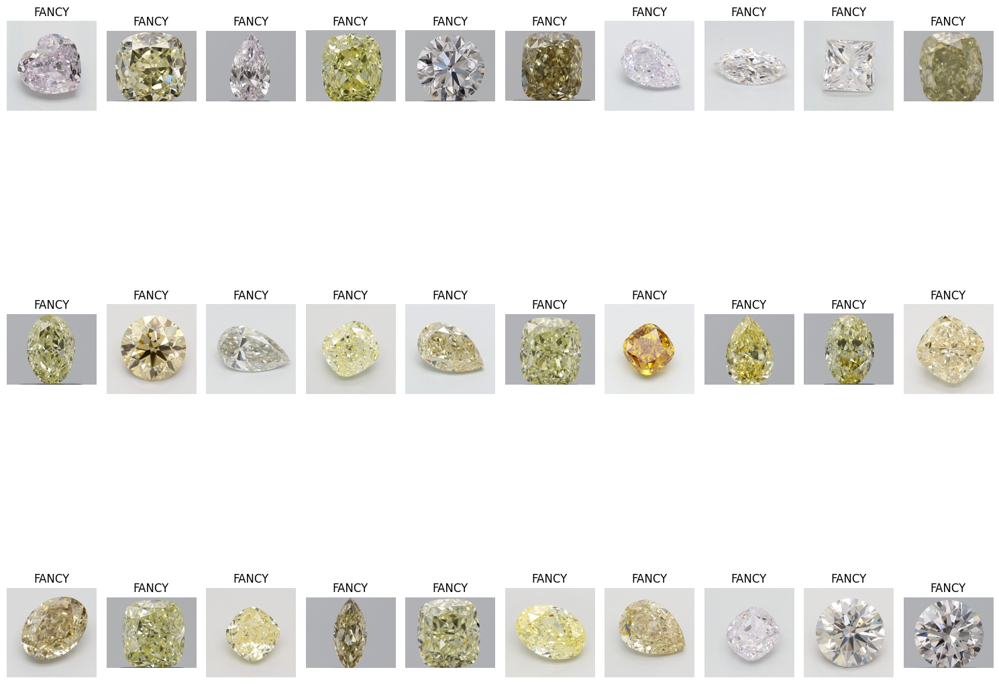

In [45]:
plot_diamonds(random_rows, 'colour')

Our FANCY colours consist most of yellow and pink colours.

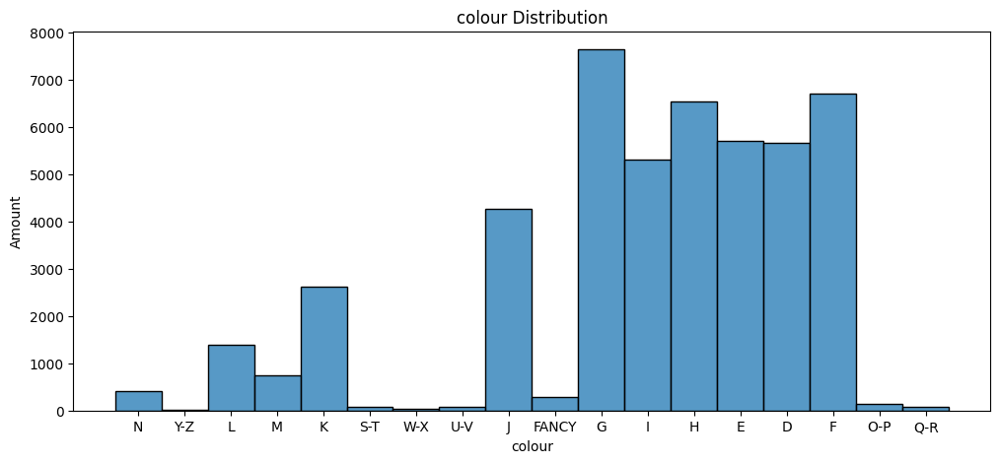

In [46]:
plot_distribution(dataframe,'colour', 'colour Distribution','colour','Amount')

As the rating letters goes up we have less and less images.

In [47]:
print(cut_unique_samples['cut'])

0           VG
1           EX
5           FG
18          GD
19872    IDEAL
26742        F
Name: cut, dtype: object


The term "IDEAL cut" is often used by various gemological organizations and diamond retailers to describe diamonds that have been cut to proportions that maximize brilliance and fire. While the Gemological Institute of America (GIA) uses the term "Excellent" as its highest cut grade, other grading laboratories, such as the American Gem Society (AGS), use the term "Ideal" for their highest cut grade.
There are other grading systems which include intermediate values such as FG that stands for Fair-Good.

lets convert the IDEAL cut to EX for uniformity.

In [48]:
dataframe['cut'] = dataframe['cut'].replace('IDEAL', 'EX')
cut_unique_samples = dataframe.drop_duplicates(subset=['cut'])
cut_unique_samples = cut_unique_samples[['path_to_img','cut']]
cut_unique_samples = cut_unique_samples.sort_values(by='cut', ascending=True)

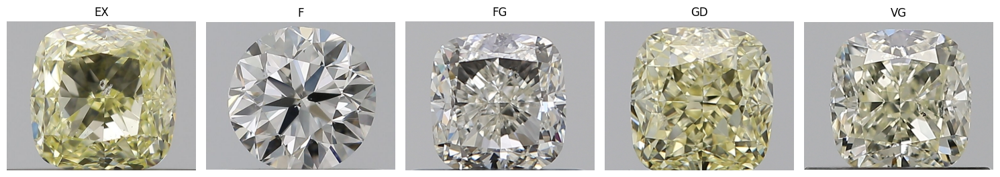

In [49]:
plot_diamonds(cut_unique_samples, 'cut')

**Cut Components:**  The cut grade considers factors such as brightness, fire, scintillation, weight ratio, durability, polish, and symmetry.

- Brightness: The amount of white light reflected from the diamond.
- Fire: The dispersion of light into the colors of the spectrum.
- Scintillation: The sparkle when the diamond moves.
- Polish: The overall smoothness of the diamond’s surface.
- Symmetry: The precision of the diamond’s cut and the alignment of its facets.

As a result, it is difficult for an untrained person to see the differences and even more so when trying from a picture.

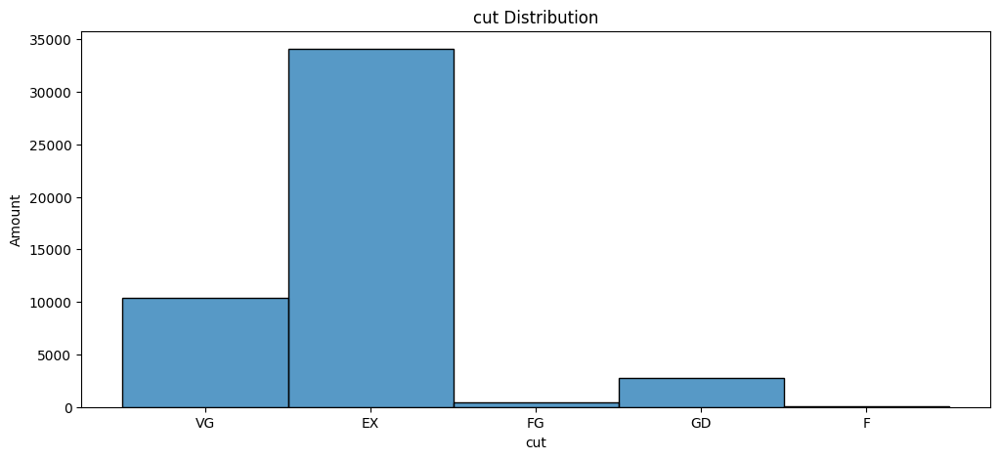

In [50]:
plot_distribution(dataframe,'cut', 'cut Distribution','cut','Amount')

We barely have any Fair cut images.

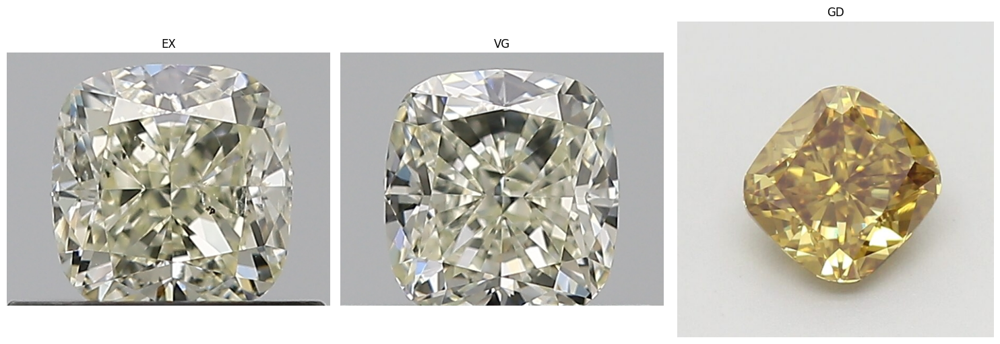

In [51]:
plot_diamonds(polish_unique_samples, 'polish')

Diamond polish is an important aspect of a diamond's overall cut quality. It refers to the smoothness of the diamond's surface and the quality of the finish on the facets. Poor polish can affect the diamond's brilliance  and overall appearance. 
using the following categories: Excellent - EX, Very Good - VG, Good - G, Fair -F, Poor - PR.
At the pictures above we can see the diamond's polish diffrences in emphasis on the briliance.
In our dataset there are no images from the ratings Fair and Poor.

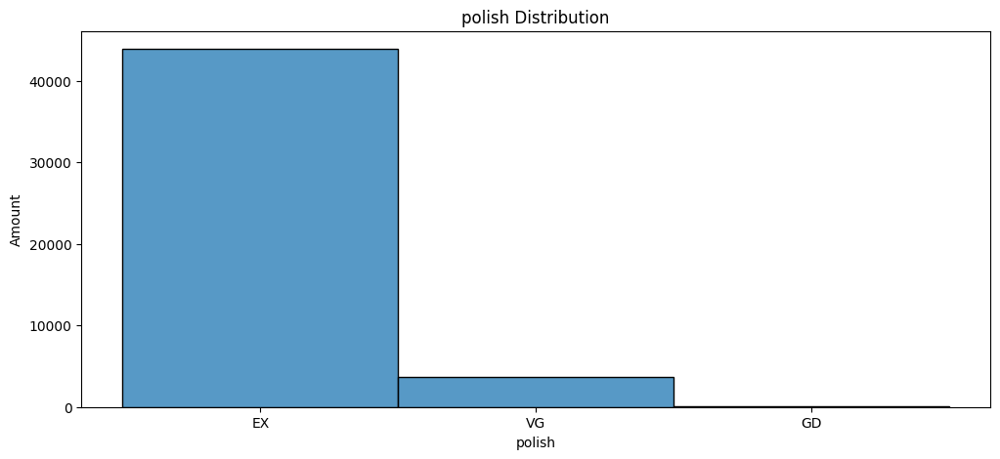

In [52]:
plot_distribution(dataframe,'polish', 'polish Distribution','polish','Amount')

Most of our samples are concentrated in the EX rating area and there are almost no pictures of the GD rating

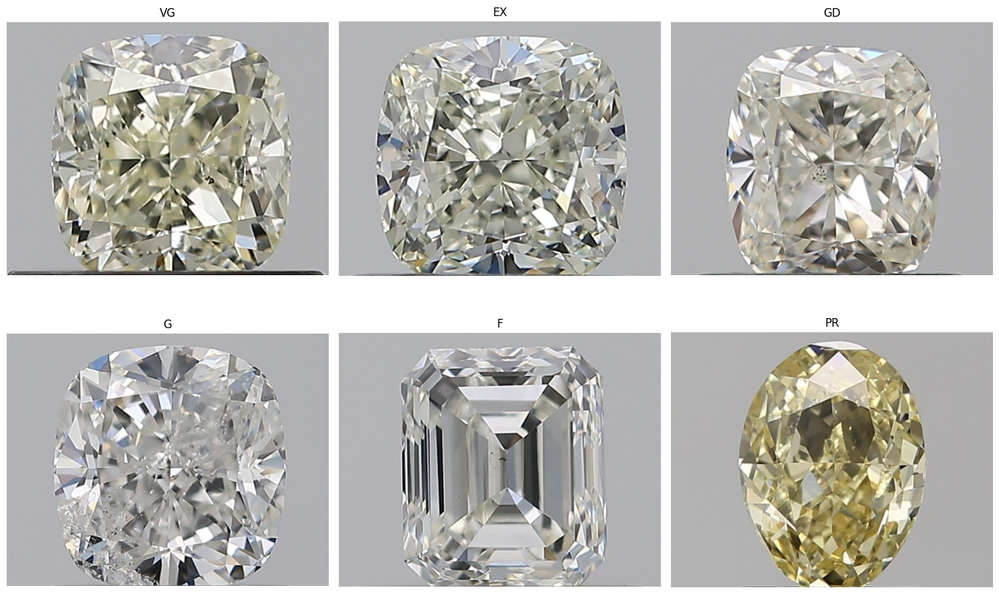

In [53]:
plot_diamonds(symmetry_unique_samples, 'symmetry', 3)

Diamond symmetry is an important aspect of a diamond's overall cut quality. It refers to the precision and alignment of the diamond's facets, which can affect the stone's brilliance and visual appeal.
using the following categories:Excellent - EX, Very Good - VG, Good - G, Fair -F, Poor - PR.
at the pictures above we can see the diamond's symmetry diffrences, Starting with the stone with the grade POOR where we can really see an unequal cut in the middle, and in the stone with the grade FAIR where the spaces between the cutting lines are unequal on both sides of the stone to the stone with the grade EXCELENT where the cutting is complex and very symmetrical

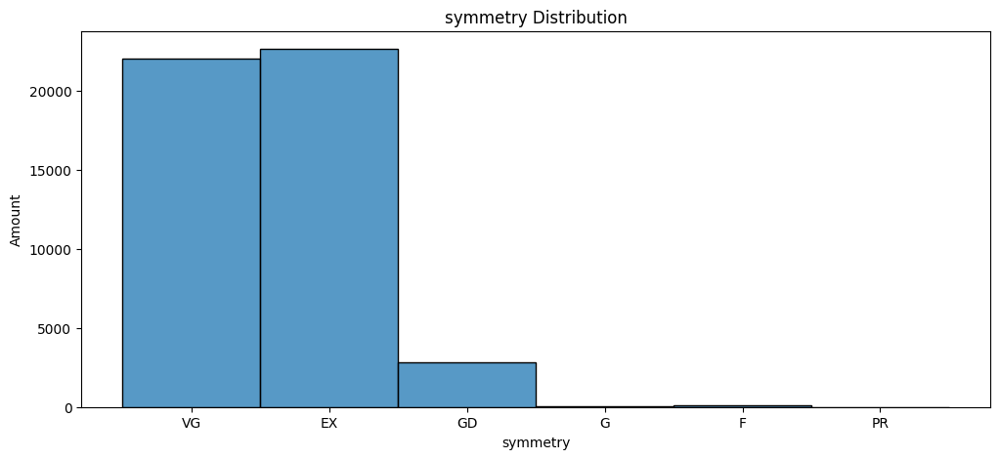

In [54]:
plot_distribution(dataframe,'symmetry', 'symmetry Distribution','symmetry','Amount')

Most of our samples are concentrated in the EX and VG rating area and there are almost no pictures of the other ratings

In [55]:
print(fluorescence_unique_samples['fluorescence'])

0             N
1             F
10           ST
15            M
260          VS
2379        VSL
2811         SL
19872      NONE
34615       MED
37549    SLIGHT
Name: fluorescence, dtype: object


Diamond fluorescence refers to the glow that some diamonds emit when exposed to ultraviolet (UV) light. This fluorescence can affect a diamond’s appearance under certain lighting conditions.

Diamond fluorescence grade using the following categories: 
- None - N
- Faint - F
- Medium - M
- Strong - S
- Very Strong - VS

However, it is possible to encounter the term "Slight" in other grading systems, such as the American Gem Society (AGS) or in the vernacular used by certain jewelers. This term is typically equivalent to "Faint" fluorescence in the GIA system.
 "Slight" and "Very Slight" (VSL) are often used interchangeably by some gemological laboratories and retailers, and they are typically considered equivalent to "Faint" in the GIA system.

We have inconsistency in the grading method so wi will make the adjustment according to the GIA grading system which most of our images graded by.

In [56]:
dataframe['fluorescence'] = dataframe['fluorescence'].replace('VSL', 'F')
dataframe['fluorescence'] = dataframe['fluorescence'].replace('SL', 'F')
dataframe['fluorescence'] = dataframe['fluorescence'].replace('SLIGHT', 'F')
dataframe['fluorescence'] = dataframe['fluorescence'].replace('MED', 'M')
dataframe['fluorescence'] = dataframe['fluorescence'].replace('NONE', 'N')

fluorescence_unique_samples = dataframe.drop_duplicates(subset=['fluorescence'])
fluorescence_unique_samples = fluorescence_unique_samples[['path_to_img','fluorescence']]
fluorescence_unique_samples = fluorescence_unique_samples.sort_values(by='fluorescence', ascending=True)

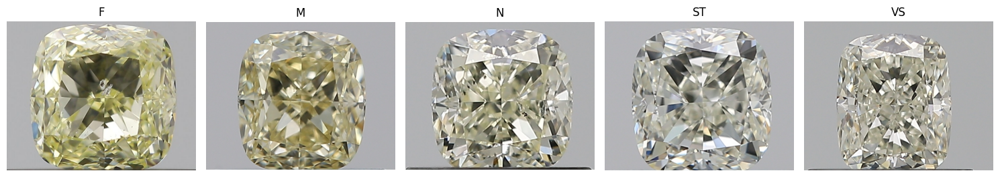

In [57]:
plot_diamonds(fluorescence_unique_samples, 'fluorescence')

In most cases, diamond fluorescence is not visible without UV light. Fluorescence is a reaction to ultraviolet light, and under normal lighting conditions, it is usually not detectable. However, there are a few scenarios where fluorescence might affect the appearance of a diamond even in non-UV lighting:

Strong or Very Strong Fluorescence: Diamonds with strong or very strong fluorescence can sometimes appear slightly hazy or oily in daylight or under certain artificial lights. This effect is more noticeable in diamonds with lower color grades (e.g., I, J, K) and can sometimes enhance the diamond's appearance by making it look whiter.

Daylight Sensitivity: Daylight contains a small amount of UV light. Diamonds with strong fluorescence might exhibit a subtle glow or a change in appearance when exposed to natural sunlight.
Therefore we will not be able to see the differences by pictures

In [58]:
print(fluorescence_unique_samples['fluorescence'])

1       F
15      M
0       N
10     ST
260    VS
Name: fluorescence, dtype: object


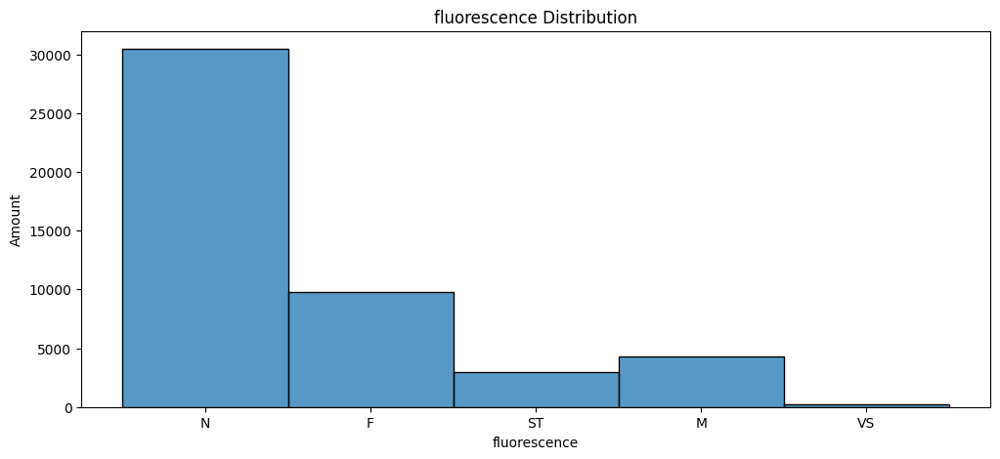

In [59]:
plot_distribution(dataframe,'fluorescence', 'fluorescence Distribution','fluorescence','Amount')

We barely have VS samples but they are quite close and sometimes even identical to the Fair rating, so if it helps we can combine them later

The following four attributes: carat, length, width, depth. 

They are features that deal with the weight and size of the diamond.
I will show samples of each of them in order to see the range of sizes that we have in the dataframe, but we will not be able to see a real difference because the sizes of the images have been adjusted to an almost uniform size.

In [60]:
print(dataframe.describe())

              carat        length         width         depth
count  47711.000000  47711.000000  47711.000000  47711.000000
mean       0.949001      6.312485      5.636218      3.606646
std        0.569667      1.431358      1.084442      0.648478
min        0.500000      4.010000      3.440000      2.110000
25%        0.550000      5.160000      4.930000      3.160000
50%        0.750000      6.010000      5.400000      3.500000
75%        1.010000      7.040000      6.270000      3.980000
max        8.000000     16.060000     12.810000      7.960000


here we can see that the carat values are between 0.5-8 but the 50% is 0.76 which suggest most of the values are on the smaller size between 0.5 to 1.

as for the rest its the same behaviour as expected, meaning:

length values are between 4-16 and most of the values are on the smaller size between 4 to 7 (millimeters).

width values are between 3-12 and most of the values are on the smaller size between 3 to 6 (millimeters).

length values are between 2-8 and most of the values are on the smaller size between 2 to 4 (millimeters).

In [61]:
carat_unique_samples.loc[:, 'bin'] = carat_unique_samples['carat'] // 1
carat_unique_samples = carat_unique_samples.drop_duplicates(subset =['bin'])

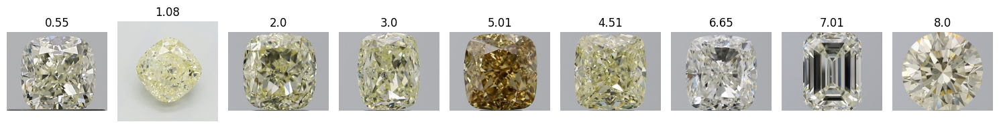

In [62]:
plot_diamonds(carat_unique_samples, 'carat')

In [63]:
length_unique_samples.loc[:, 'bin'] = length_unique_samples['length'] // 1
length_unique_samples = length_unique_samples.drop_duplicates(subset =['bin'])

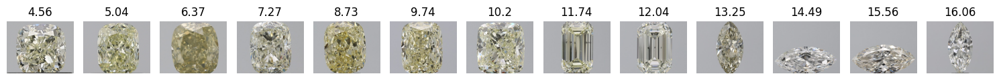

In [64]:
plot_diamonds(length_unique_samples, 'length',13)

In [65]:
width_unique_samples.loc[:, 'bin'] = width_unique_samples['width'] // 1
width_unique_samples = width_unique_samples.drop_duplicates(subset =['bin'])

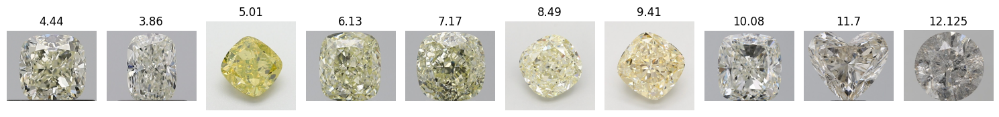

In [66]:
plot_diamonds(width_unique_samples, 'width')

In [67]:
depth_unique_samples.loc[:, 'bin'] = depth_unique_samples['depth'] // 1
depth_unique_samples = depth_unique_samples.drop_duplicates(subset =['bin'])

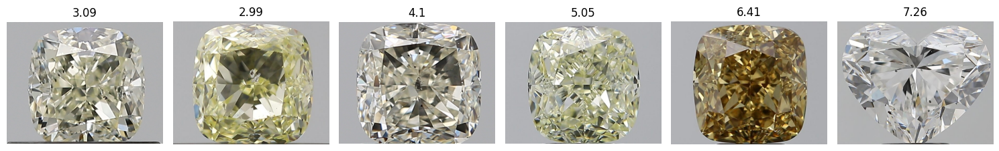

In [68]:
plot_diamonds(depth_unique_samples, 'depth')

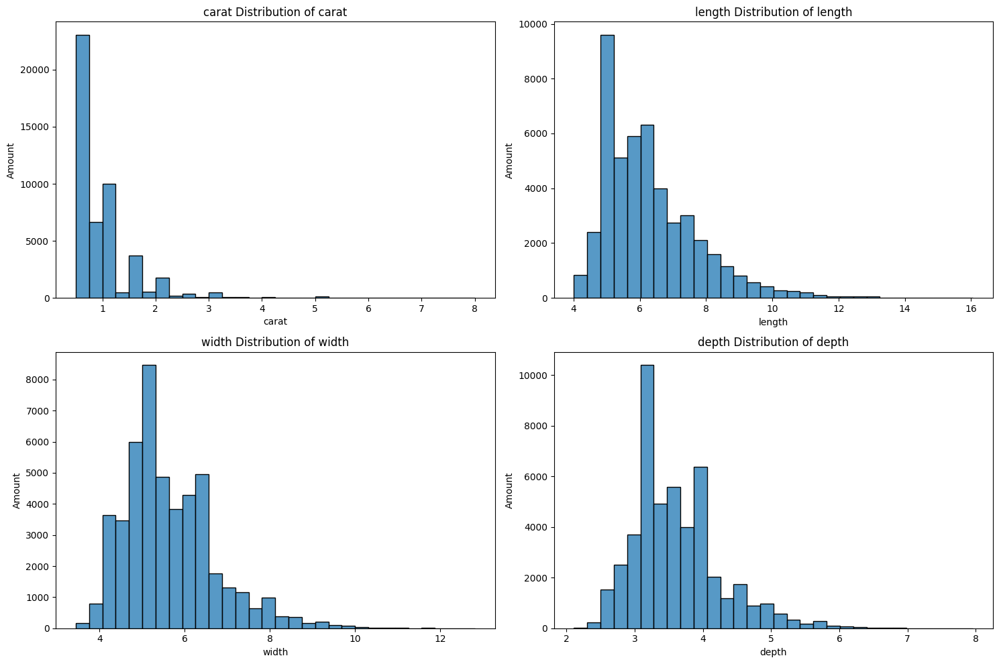

In [69]:
columns_of_sizes = ['carat','length','width','depth']

# Calculate the number of rows and columns for the subplots grid
n_cols = 2  
n_rows = 2 

# Create subplots 
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Plot distributions
for i, label in enumerate(columns_of_sizes):
    label_data = dataframe[label]
    sns.histplot(label_data, bins=30, ax=axes[int(i/n_cols), i%n_cols])
    axes[int(i/n_cols), i%n_cols].set_title(f'{label} Distribution of {label}')
    axes[int(i/n_cols), i%n_cols].set_xlabel(label)
    axes[int(i/n_cols), i%n_cols].set_ylabel('Amount')
plt.tight_layout()
plt.show()

It can be seen that in all four of these characteristics, the quantity is large when it comes to the small sizes but gets smaller as the sizes are bigger.

And it makes sense since the weight indicates the amount of material that is characterized by a different size when it comes to the same type of material.

That is, we will expect to see a connection between these characteristics and therefore we may be able to reduce them.

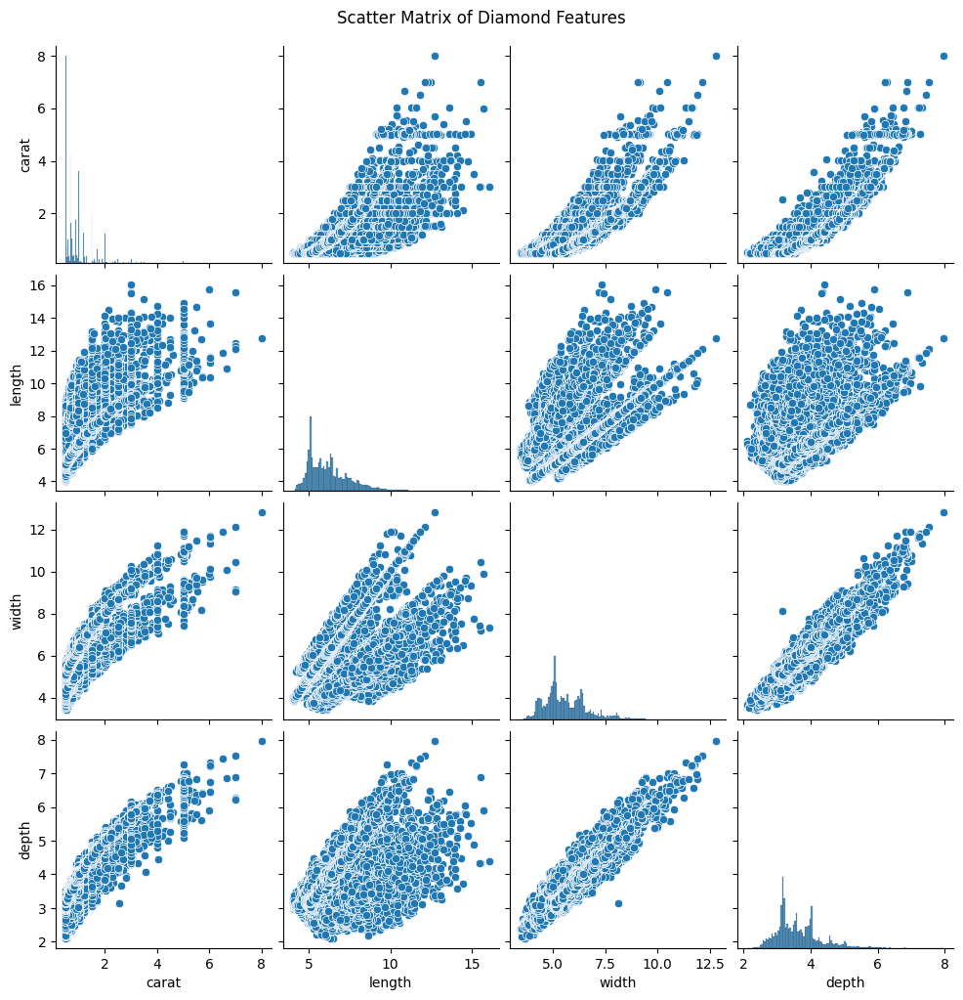

In [70]:
# Selecting relevant columns for the scatter matrix
features = ['carat','length','width','depth']
# Create a scatter matrix
sns.pairplot(dataframe[features])
plt.suptitle('Scatter Matrix of Diamond Features', y=1.02)
plt.show()

Here in the scatter matrix you can see the relationships between these four variables.
When it really seems as if there is a linear relationship between the width and depth characteristics, and an almost parabolic relationship between the depth and weight characteristics.
If we find these relations it will be possible to express one by the other.

### Image analysis

Before we can work on the images, we will need to check if there are any abnormal images.
That is, photos whose quality is less good than the rest of the photos and may damage our evaluations.

In [71]:
column_names = dataframe.columns.tolist()
column_names.remove('path_to_img')
image_paths = dataframe['path_to_img']

In [72]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

Mean pixel values refer to the average intensity or color value of all the pixels in a given image or a specific region of an image. These values provide a statistical measure of the overall brightness or color of the image.

Image contrast refers to the difference in luminance or color that makes an object distinguishable from other objects and the background. High contrast images have a wide range of tones and colors from the darkest blacks to the brightest whites, making details more discernible. Low contrast images, on the other hand, have a narrow range of tones, resulting in a more muted or washed-out appearance where details might be harder to see. Contrast is an important aspect in image processing and photography as it affects the clarity and visual appeal of an image.

The standard deviation for a color channel in an image is a measure of how much the pixel values in that channel vary from the mean value of the channel. It provides insight into the contrast and variability of the color in the image.

Why Compute Standard Deviation for Each Color Channel?
- Contrast Measurement: High standard deviation indicates high contrast, while low standard deviation indicates low contrast.
- Color Consistency: Helps in identifying whether an image has consistent color distribution.
- Anomaly Detection: Useful for detecting unusual images with abnormal color distributions.

Now we will identify the exceptions, we will understand their distribution in the data and based on this we will decide whether to get rid of them

In [73]:
# Function to compute mean and standard deviation for each color channel
def compute_color_statistics(image):
    # Split the image into its color channels
    channels = cv2.split(image)
    stats = {}
    for i, channel in enumerate(['Blue', 'Green', 'Red']):
        mean = np.mean(channels[i])
        std_dev = np.std(channels[i])
        stats[channel] = (mean, std_dev)
    return stats

In [74]:
# Function to find outliers based on color channel statistics
def find_color_outliers(statistics, threshold=3):
    means = {channel: [] for channel in ['Blue', 'Green', 'Red']}
    std_devs = {channel: [] for channel in ['Blue', 'Green', 'Red']}
    
    for stat in statistics:
        for channel in ['Blue', 'Green', 'Red']:
            means[channel].append(stat[channel][0])
            std_devs[channel].append(stat[channel][1])
    
    outliers = []
    for channel in ['Blue', 'Green', 'Red']:
        mean_of_means = np.mean(means[channel])
        std_of_means = np.std(means[channel])
        channel_outliers = [i for i, mean in enumerate(means[channel]) if abs(mean - mean_of_means) > threshold * std_of_means]
        outliers.extend(channel_outliers)
    
    # Removing duplicates
    outliers = list(set(outliers))
    return outliers

In [75]:
%%time

# Function to get image statistics
def get_image_statistics(image_paths):
    statistics = []
    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is not None:
            statistics.append(compute_color_statistics(img))
    return statistics

# Get statistics of all images
statistics = get_image_statistics(image_paths)

CPU times: total: 5min 52s
Wall time: 16min 16s


In [76]:
# Identify outliers
outliers = find_color_outliers(statistics)

In [77]:
image_paths = image_paths.reset_index(drop=True)
outlier_files = [image_paths[i] for i in outliers]

In [78]:
df = pd.DataFrame(outlier_files, columns=['path_to_img'])
merged_df = pd.merge(df, dataframe, on='path_to_img', how='inner')

In [79]:
value_counts = merged_df['shape'].value_counts()
print(value_counts)

shape
emerald     212
round       202
cushion     156
pear         43
oval         34
heart        18
princess     14
marquise      3
Name: count, dtype: int64


Since we have enough images, and the percentage that the abnormal images make up of each group is small, the advantage of getting rid of them outweighs the option of keeping them, so we will do so

In addition, we will check if we have blurry images and get rid of them as well

In [80]:
condition = ~dataframe.apply(tuple, 1).isin(merged_df.apply(tuple, 1))
dataframe = dataframe[condition]
dataframe = dataframe.reset_index(drop=True)

In [81]:
%%time

def is_blurry(image, threshold=100):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    variance = cv2.Laplacian(gray, cv2.CV_64F).var()
    return variance < threshold

blurry_images = []
for img_path in image_paths:
    img = cv2.imread(img_path)
    if is_blurry(img):
        blurry_images.append(img_path)

CPU times: total: 5min 55s
Wall time: 7min 27s


In [82]:
blurry_images_df = pd.DataFrame(blurry_images, columns=['path_to_img'])
blurry_merged_df = pd.merge(blurry_images_df, dataframe, on='path_to_img', how='inner')

In [83]:
condition = ~dataframe.apply(tuple, 1).isin(blurry_merged_df.apply(tuple, 1))
dataframe = dataframe[condition]
dataframe = dataframe.reset_index(drop=True)

In [84]:
value_counts = blurry_merged_df['shape'].value_counts()
print(value_counts)

shape
round      11
heart       2
cushion     1
oval        1
pear        1
Name: count, dtype: int64


There really aren't many blurry images probably because we got rid of the outliers first

We will also check the dimensions of the images and see if they are uniform, or if they are very scattered and we will have to make adjustments

In [85]:
%%time

image_paths = dataframe['path_to_img']

# Function to get image dimensions
def get_image_dimensions(image_paths):
    dimensions = []
    for img_path in image_paths:
        with Image.open(img_path) as img:
            width, height = img.size
            dimensions.append((img_path, width, height))
    return dimensions

# Get dimensions of all images
image_dimensions = get_image_dimensions(image_paths)

# Convert to a DataFrame for easier visualization
df_dimensions = pd.DataFrame(image_dimensions, columns=['path_to_img', 'Width', 'Height'])

CPU times: total: 13.4 s
Wall time: 25.3 s


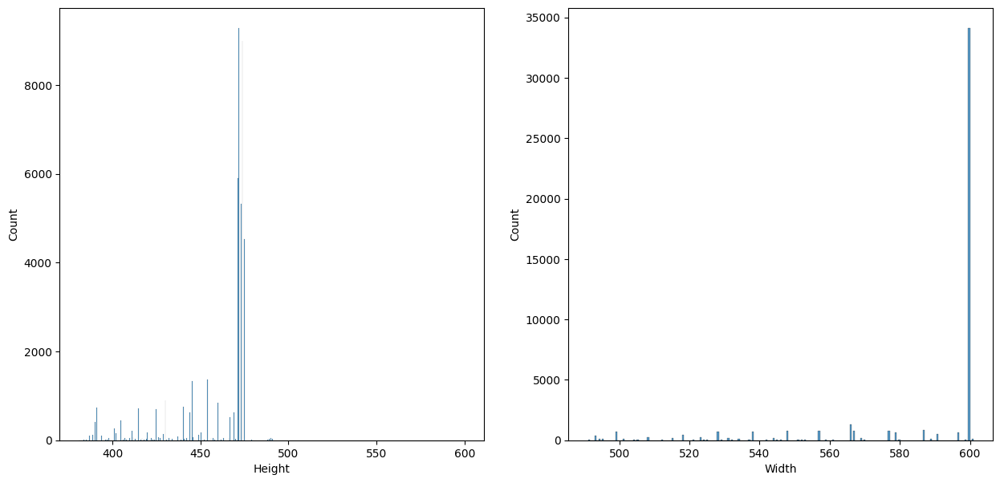

In [86]:
fig, axis = plt.subplots(1, 2, figsize=(15,7))
sns.histplot(df_dimensions['Height'], ax=axis[0])
sns.histplot(df_dimensions['Width'], ax=axis[1])
plt.show()

The dimensions of the images are:
- Width: between 490 and 610.
- Height: between 375 and 610.

The sizes of the images are not too large, so you can work with them.
The quality of the images is not high, and may not be sufficient for identifying the subtleties between the characteristics of the diamonds.
We shall address the image size problem when we start to design the algorithms.

### Feature Extraction

Feature extraction is a key process in machine learning and computer vision that involves transforming raw data into a set of measurable, informative attributes (features) that can be used to perform tasks like classification, clustering, and regression. In the context of images, feature extraction involves identifying and quantifying important aspects of the image that capture its essential characteristics and properties.

In [87]:
%%time

# Function to get image statistics
def get_images_grey(image_paths):
    images = []
    for img_path in image_paths:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        image_resized = cv2.resize(img, (224, 224))
        image_normalized = image_resized.astype('float32') / 255.0
        if img is not None:
            images.append(image_normalized)
    return images

images = get_images_grey(image_paths)

CPU times: total: 1min 30s
Wall time: 4min 38s


**Histogram of Oriented Gradients (HOG)**:  
is a feature extraction technique widely used in computer vision and image processing for object detection. The main idea behind HOG is to capture the shape and structure of objects within an image by focusing on the distribution of intensity gradients or edge directions.

In [88]:
from skimage.feature import hog

#Extract HOG features
def extract_hog_features(batch_images):
    hog_features = []
    for image in batch_images:
        # Compute HOG features
        features, hog_image = hog(image, 
                                  orientations=9, 
                                  pixels_per_cell=(8, 8),
                                  cells_per_block=(2, 2), 
                                  block_norm='L2-Hys', 
                                  visualize=True, 
                                  feature_vector=True)
        hog_features.append(features)
    return np.array(hog_features)

#Function to process images in batches
def process_images_in_batches(images, batch_size=100):
    all_features = []

    # Process images in batches
    for i in range(0, len(images), batch_size):
        batch = images[i:i + batch_size]        
        # Extract HOG features for the current batch
        batch_features = extract_hog_features(batch)
        all_features.extend(batch_features)
        
        print(f"Processed batch {i//batch_size + 1}/{(len(images)//batch_size) + 1}")
    
    return np.array(all_features)

**Features extracted by HOG**

In [89]:
%%time    
# Process all images and extract HOG features in batches
hog_features = process_images_in_batches(images, batch_size=1000)

Processed batch 1/48
Processed batch 2/48
Processed batch 3/48
Processed batch 4/48
Processed batch 5/48
Processed batch 6/48
Processed batch 7/48
Processed batch 8/48
Processed batch 9/48
Processed batch 10/48
Processed batch 11/48
Processed batch 12/48
Processed batch 13/48
Processed batch 14/48
Processed batch 15/48
Processed batch 16/48
Processed batch 17/48
Processed batch 18/48
Processed batch 19/48
Processed batch 20/48
Processed batch 21/48
Processed batch 22/48
Processed batch 23/48
Processed batch 24/48
Processed batch 25/48
Processed batch 26/48
Processed batch 27/48
Processed batch 28/48
Processed batch 29/48
Processed batch 30/48
Processed batch 31/48
Processed batch 32/48
Processed batch 33/48
Processed batch 34/48
Processed batch 35/48
Processed batch 36/48
Processed batch 37/48
Processed batch 38/48
Processed batch 39/48
Processed batch 40/48
Processed batch 41/48
Processed batch 42/48
Processed batch 43/48
Processed batch 44/48
Processed batch 45/48
Processed batch 46/

### Dimensionality Reduction

Dimensionality reduction is a technique used in machine learning and data analysis to reduce the number of input variables (features) in a dataset while preserving as much information as possible. This is often necessary when working with high-dimensional data, which can be computationally expensive and may lead to problems like overfitting and the curse of dimensionality.

I will test several methods and choose the one that performs better

**Reduce dimentionality by PCA algorithem down to 50 dimentions**

In [91]:
%%time
from sklearn.decomposition import IncrementalPCA

n_samples, n_features = hog_features.shape
# Desired dimension after PCA
desired_dimension = 50  
# Initialize IncrementalPCA
batch_size = 999  
ipca = IncrementalPCA(n_components=desired_dimension)

# Fit the IncrementalPCA model in batches
for i in range(0, n_samples, batch_size):
    # Extract batch
    batch_data = hog_features[i:i + batch_size]
    
    # Incrementally fit the model with the current batch
    ipca.partial_fit(batch_data)

# Transform the data using the fitted model in batches
pca_result = np.zeros((n_samples, desired_dimension))

for i in range(0, n_samples, batch_size):
    batch_data = hog_features[i:i + batch_size]
    
    # Transform the batch
    pca_result[i:i + batch_size] = ipca.transform(batch_data)

# pca_result now contains the HOG features in a lower-dimensional space

CPU times: total: 8h 50min 53s
Wall time: 2h 27min 14s


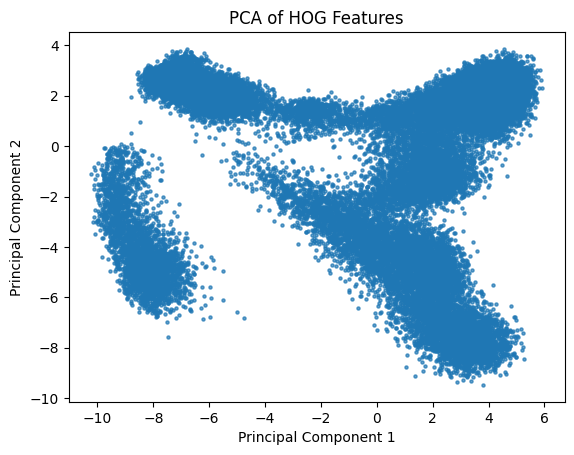

In [92]:
# Scatter plot of the PCA results
plt.scatter(pca_result[:, 0], pca_result[:, 1], s=5, alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of HOG Features')
plt.show()

You can see the concentration of the graph in about four blocks, but we see about five centers.

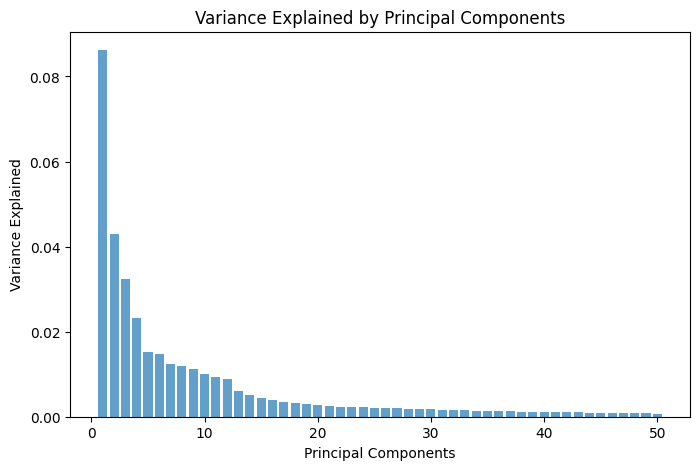

In [93]:
# Explained variance ratio
explained_variance = ipca.explained_variance_ratio_

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7)
plt.xlabel('Principal Components')
plt.ylabel('Variance Explained')
plt.title('Variance Explained by Principal Components')
plt.show()

From the variance graph we can see the effect of each main component and its contribution

In [94]:
import matplotlib.pyplot as plt
import numpy as np

# Example data: replace with your actual data
explained_variance_ratio = ipca.explained_variance_ratio_

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(explained_variance_ratio)

# Create a bar plot for explained variance ratio
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.7, label='Individual Explained Variance')

# Add a cumulative variance line
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', linestyle='--', color='red', label='Cumulative Explained Variance')

# Labels and title
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio of Principal Components')
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.legend(loc='best')

# Display percentages on top of bars
for i, v in enumerate(explained_variance_ratio):
    plt.text(i + 1, v + 0.01, f"{v:.2%}", ha='center')

plt.tight_layout()
plt.show()

**Reduce dimentionality by PCA algorithem 3d**

In [98]:
%%time
from sklearn.decomposition import IncrementalPCA
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

# Example: HOG features as a large numpy array
n_samples, n_features = hog_features.shape

# Initialize IncrementalPCA with 3 components for 3D visualization
ipca = IncrementalPCA(n_components=3)
batch_size = 1000  # Adjust batch size based on your system's memory capacity

# Fit the IncrementalPCA model in batches
for i in range(0, n_samples, batch_size):
    batch_data = hog_features[i:i + batch_size]
    ipca.partial_fit(batch_data)

# Transform the data using the fitted model in batches
pca_result_3d = np.zeros((n_samples, 3))

for i in range(0, n_samples, batch_size):
    batch_data = hog_features[i:i + batch_size]
    pca_result_3d[i:i + batch_size] = ipca.transform(batch_data)

KeyboardInterrupt: 

In [ ]:
# 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_result_3d[:, 0], pca_result_3d[:, 1], pca_result_3d[:, 2], s=5, alpha=0.7)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('3D PCA of HOG Features')
plt.show()

Here we have presented the PCA in 3 dimensions so that we can better distinguish between the concentrations

**Reduce dimentionality by UMAP algorithem**

In [99]:
%%time
import umap
hog_features = np.array(hog_features)

# Initialize UMAP model
umap_model = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean')

# Fit and transform the HOG features
umap_model_results = umap_model.fit_transform(hog_features)

# umap_model_results now contains the HOG features in a lower-dimensional space


CPU times: total: 16min 24s
Wall time: 6min 44s


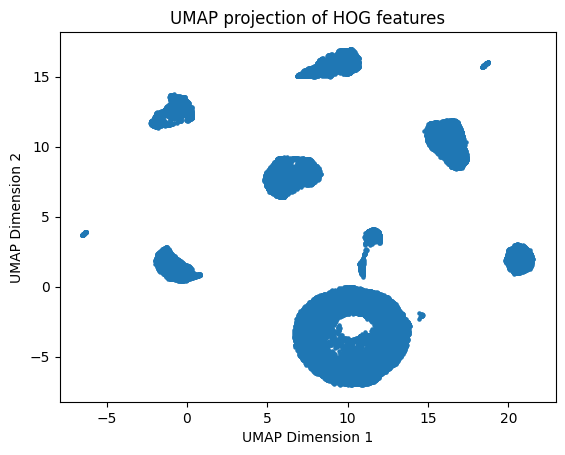

CPU times: total: 46.9 ms
Wall time: 245 ms


In [100]:
%%time
import matplotlib.pyplot as plt

plt.scatter(umap_model_results[:, 0], umap_model_results[:, 1], s=5)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of HOG features')
plt.show()

In [102]:
%%time
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Assuming you have labeled data with `hog_features` and corresponding labels `y`
n_samples, n_features = hog_features.shape
desired_dimension = 10  # Desired dimension after LDA, must be <= min(n_classes - 1, n_features)
batch_size = 999  

# Initialize LDA with partial_fit
lda = LinearDiscriminantAnalysis(n_components=desired_dimension)

# To perform partial fitting, we need to provide all possible classes
y =np.array(['stock_number', 'shape', 'carat', 'clarity', 'colour', 'cut', 'polish', 'symmetry', 'fluorescence',	'length', 'width', 'depth'])
classes = np.unique(y)

# Fit the LDA model in batches
for i in range(0, n_samples, batch_size):
    # Extract batch data and corresponding labels
    batch_data = hog_features[i:i + batch_size]
    batch_labels = y[i:i + batch_size]
    
    # Incrementally fit the model with the current batch
    lda.partial_fit(batch_data, batch_labels, classes=classes)

# Transform the data using the fitted model in batches
lda_result = np.zeros((n_samples, desired_dimension))

for i in range(0, n_samples, batch_size):
    batch_data = hog_features[i:i + batch_size]
    
    # Transform the batch
    lda_result[i:i + batch_size] = lda.transform(batch_data)

# lda_result now contains the HOG features in a lower-dimensional space with class separability in mind


AttributeError: 'LinearDiscriminantAnalysis' object has no attribute 'partial_fit'

### Image Clustering

K-Means Clustering

In [103]:
from sklearn.cluster import KMeans

pca_result = np.array(pca_result)

# Define the number of clusters
n_clusters = 3  
# Initialize the KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
# Fit the model to the PCA-reduced data
kmeans.fit(pca_result)
# Get cluster labels
kmeans_labels = kmeans.labels_

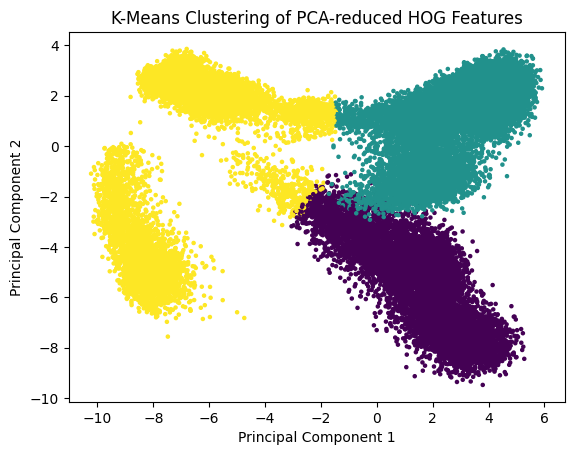

In [104]:
# Plotting the clusters
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=kmeans_labels, cmap='viridis', s=5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering of PCA-reduced HOG Features')
plt.show()

Choosing the Number of Clusters with the "elbow method"' which helps determine the optimal number of clusters by plotting the sum of squared distances from each point to its assigned cluster center. The "elbow" point in this plot indicates the best number of clusters.

In [105]:
kmeans_sse = []  # Sum of squared errors

# Calculate SSE for different numbers of clusters
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(pca_result)
    kmeans_sse.append(kmeans.inertia_)

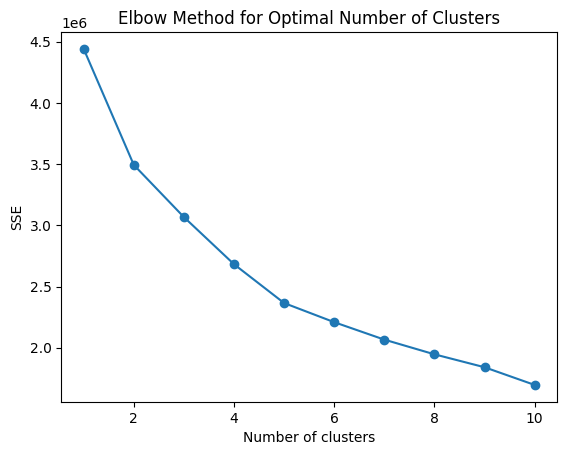

In [106]:
# Plotting the elbow method graph
plt.plot(range(1, 11), kmeans_sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.show()

DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

In [107]:
from sklearn.cluster import DBSCAN

# Initialize the DBSCAN model
dbscan = DBSCAN(eps=0.5, min_samples=5)  # You may need to adjust eps and min_samples

# Fit the model to the PCA-reduced data
dbscan.fit(pca_result)

# Get cluster labels
dbscan_labels = dbscan.labels_

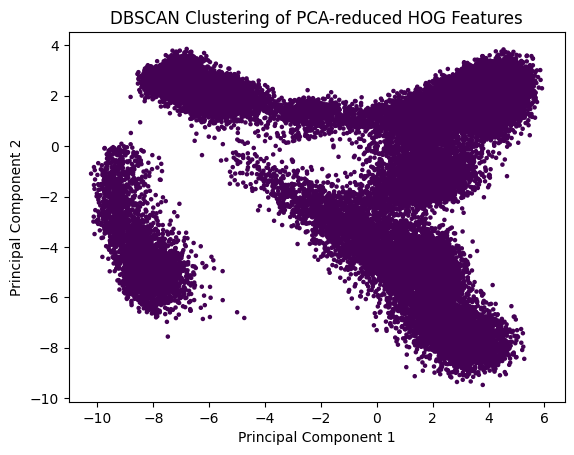

In [108]:
# Plotting the clusters
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=dbscan_labels, cmap='viridis', s=5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clustering of PCA-reduced HOG Features')
plt.show()

Agglomerative Clustering

In [109]:
from sklearn.cluster import AgglomerativeClustering

# Initialize the Agglomerative Clustering model
agg_clustering = AgglomerativeClustering(n_clusters=3)  # Adjust n_clusters as needed

# Fit the model to the PCA-reduced data
agg_clustering_labels = agg_clustering.fit_predict(pca_result)

KeyboardInterrupt: 

In [ ]:
# Plotting the clusters
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=agg_clustering_labels, cmap='viridis', s=5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Agglomerative Clustering of PCA-reduced HOG Features')
plt.show()

## Prediction

Now we will try to predict the diamonds by different algorithms based on the information we cleaned, and by the characteristics we extracted and grouped

We will start by converting the data frame values to discrete values, so that the models can handle them

In [110]:
dataframe_for_models = dataframe.drop('path_to_img', axis=1)
dataframe_for_models.head()

,shape,carat,clarity,colour,cut,polish,symmetry,fluorescence,length,width,depth
0,cushion,0.55,SI2,N,VG,EX,VG,N,4.56,4.44,3.09
1,cushion,0.50,SI1,L,VG,EX,VG,N,4.87,4.19,2.89
2,cushion,0.50,VS2,M,EX,EX,VG,F,4.73,4.28,2.84
3,cushion,0.51,SI1,M,EX,EX,VG,N,4.47,4.44,3.05
4,cushion,0.50,SI1,K,FG,EX,VG,N,4.27,4.14,3.06


In [111]:
shape_dict = {'cushion':1, 'emerald':2, 'heart':3, 'marquise':4, 'oval':5, 'pear':6, 'princess':7, 'round':8}
clarity_dict = {'FL':16,'IF':15,'VVS1':14,'VVS2':13,'VS1':12,'VS2':11,'SI1':10,'SI2':9,'SI3':8,'I1':7,'I2':6,'I3':5,'I4':4,'I5':3,'I6':2,'I7':1}
colour_dict = {'D':1,'E':2,'F':3,'G':4,'H':5,'I':6,'J':7,'K':8,'L':9,'M':10,'N':11,'O-P':12,'Q-R':13,'S-T':14,'U-V':15,'W-X':16,'Y-Z':17,'FANCY':18}
cut_dict = {'EX':5, 'VG':4,'GD':3,'FG':2,'F':1}
polish_dict = {'EX':5, 'VG':4,'GD':3}
symmetry_dict = {'EX':6, 'VG':5,'GD':4,'G':3,'F':2,'PR':1}
fluorescence_dict = {'N':5, 'F':4, 'M':3,'ST':2,'VS':1}

In [112]:
dataframe_for_models['shape'] = dataframe_for_models['shape'].map(shape_dict)
dataframe_for_models['clarity'] = dataframe_for_models['clarity'].map(clarity_dict)
dataframe_for_models['colour'] = dataframe_for_models['colour'].map(colour_dict)
dataframe_for_models['cut'] = dataframe_for_models['cut'].map(cut_dict)
dataframe_for_models['polish'] = dataframe_for_models['polish'].map(polish_dict)
dataframe_for_models['symmetry'] = dataframe_for_models['symmetry'].map(symmetry_dict)
dataframe_for_models['fluorescence'] = dataframe_for_models['fluorescence'].map(fluorescence_dict)

In [113]:
dataframe_nulls = dataframe_for_models[dataframe_for_models.isnull().any(axis=1)]
dataframe_nulls.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   shape         0 non-null      int64  
 1   carat         0 non-null      float64
 2   clarity       0 non-null      int64  
 3   colour        0 non-null      int64  
 4   cut           0 non-null      int64  
 5   polish        0 non-null      int64  
 6   symmetry      0 non-null      int64  
 7   fluorescence  0 non-null      int64  
 8   length        0 non-null      float64
 9   width         0 non-null      float64
 10  depth         0 non-null      float64
dtypes: float64(4), int64(7)
memory usage: 0.0 bytes


**Logistic regretion model**

We will start with a logistic regression model using the Softmax Regression technique (also known as multinomial logistic regression).
We will give this model the information we cleaned and the characteristics we extracted and grouped so that these will be its basic assumptions and from which it will draw its conclusions

In [114]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.multioutput import MultiOutputClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, hamming_loss
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Combine cluster labels with original features
# Stack the cluster labels as a new column to the reduced features
X = np.hstack((pca_result, kmeans_labels.reshape(-1, 1)))

# Define the multi-class target variable
y = np.array(dataframe_for_models)  

print("Original y shape:", y.shape)

# Convert continuous outputs to discrete classes using binning
kb = KBinsDiscretizer(n_bins=11, encode='ordinal', strategy='uniform')
y_binned = kb.fit_transform(y)

print("Binned y shape:", y_binned.shape)  # Should be the same as y shape

# Split the data into training and testing sets
# Use y_binned instead of y for the split
X_train, X_test, y_train, y_test = train_test_split(X, y_binned, test_size=0.2, random_state=42)

#  Train the logistic regression model with multi-class targets
logreg = LogisticRegression(max_iter=1000, random_state=42, solver='lbfgs')
multi_output_logreg = MultiOutputClassifier(logreg)
multi_output_logreg.fit(X_train, y_train)

# Evaluate the model
y_pred = multi_output_logreg.predict(X_test)

Original y shape: (47013, 11)
Binned y shape: (47013, 11)



Classification Report for output 1:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2411
         1.0       1.00      1.00      1.00      1367
         2.0       1.00      1.00      1.00      5625

    accuracy                           1.00      9403
   macro avg       1.00      1.00      1.00      9403
weighted avg       1.00      1.00      1.00      9403



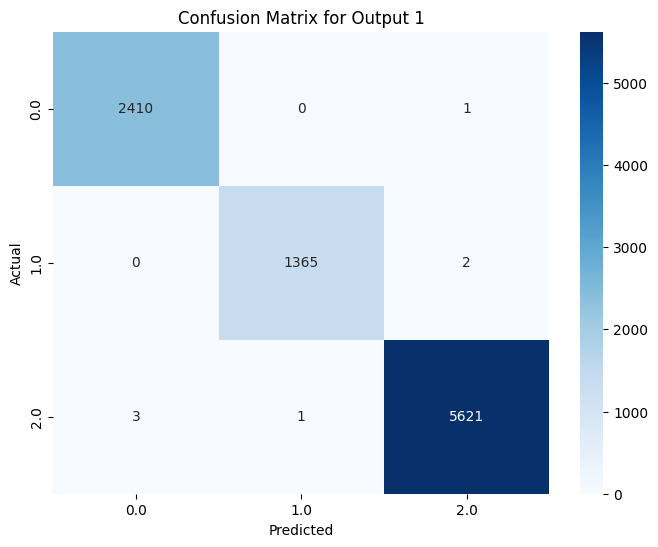

Hamming Loss for Output 1: 0.00

Classification Report for output 2:
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      9243
         1.0       0.55      0.07      0.12       158
         2.0       0.00      0.00      0.00         2

    accuracy                           0.98      9403
   macro avg       0.51      0.36      0.37      9403
weighted avg       0.98      0.98      0.98      9403



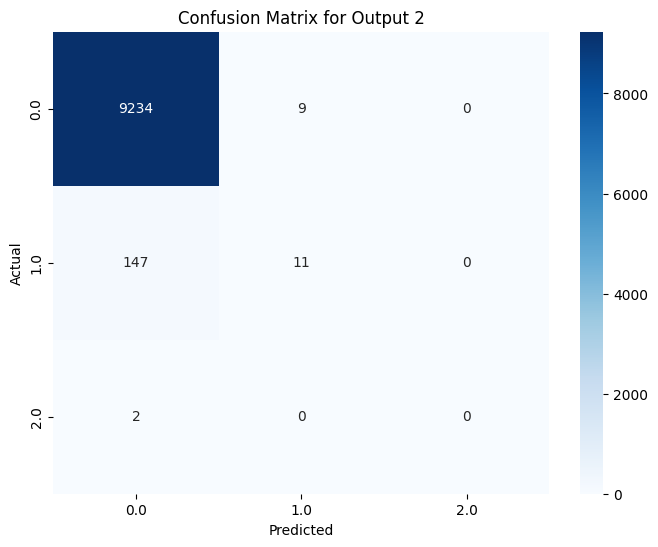

Hamming Loss for Output 2: 0.02

Classification Report for output 3:
              precision    recall  f1-score   support

         0.0       1.00      0.75      0.86         8
         1.0       0.67      0.93      0.78      6074
         2.0       0.54      0.14      0.23      3321

    accuracy                           0.65      9403
   macro avg       0.74      0.61      0.62      9403
weighted avg       0.62      0.65      0.58      9403



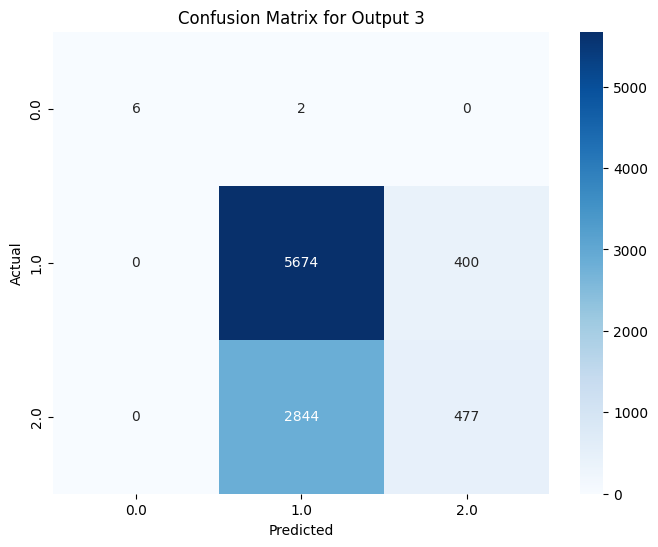

Hamming Loss for Output 3: 0.35

Classification Report for output 4:
              precision    recall  f1-score   support

         0.0       0.79      1.00      0.88      7406
         1.0       1.00      0.00      0.00      1951
         2.0       1.00      0.02      0.04        46

    accuracy                           0.79      9403
   macro avg       0.93      0.34      0.31      9403
weighted avg       0.83      0.79      0.69      9403



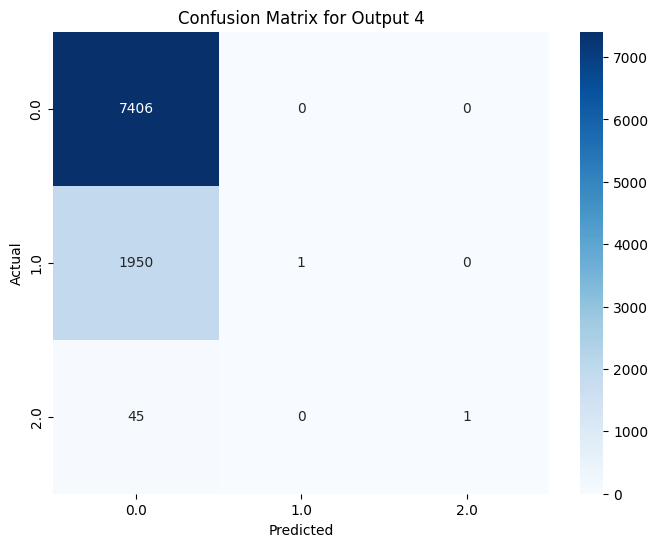

Hamming Loss for Output 4: 0.21

Classification Report for output 5:
              precision    recall  f1-score   support

         0.0       0.40      0.13      0.20       104
         1.0       0.08      0.00      0.00       539
         2.0       0.93      1.00      0.97      8760

    accuracy                           0.93      9403
   macro avg       0.47      0.38      0.39      9403
weighted avg       0.88      0.93      0.90      9403



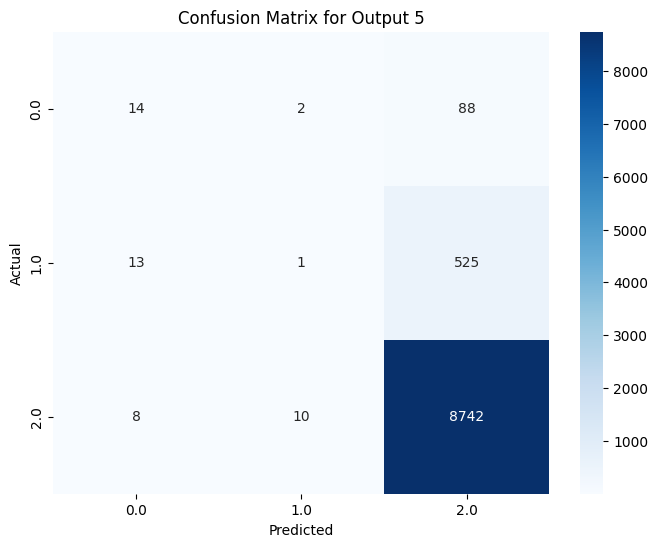

Hamming Loss for Output 5: 0.07

Classification Report for output 6:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.00      0.00      0.00       686
         2.0       0.92      1.00      0.96      8694

    accuracy                           0.92      9403
   macro avg       0.31      0.33      0.32      9403
weighted avg       0.85      0.92      0.89      9403



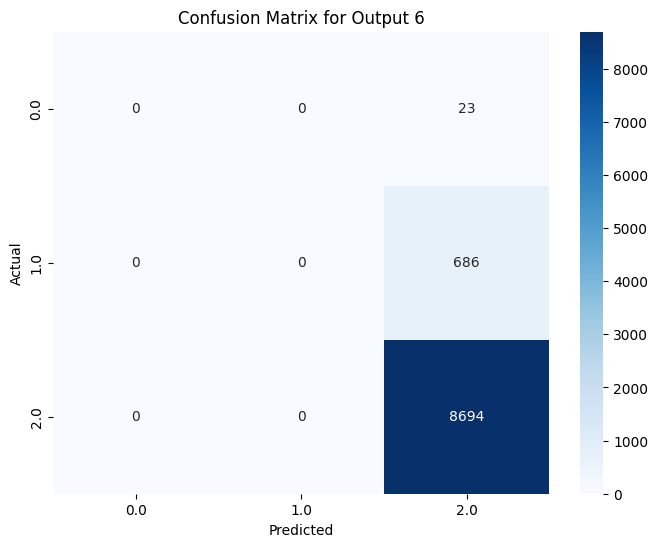

Hamming Loss for Output 6: 0.08

Classification Report for output 7:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.00      0.00      0.00       524
         2.0       0.94      1.00      0.97      8858

    accuracy                           0.94      9403
   macro avg       0.31      0.33      0.32      9403
weighted avg       0.89      0.94      0.91      9403



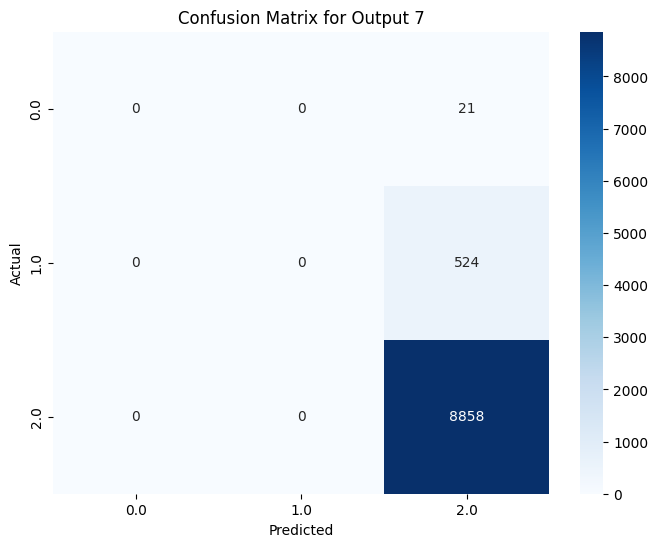

Hamming Loss for Output 7: 0.06

Classification Report for output 8:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       599
         1.0       0.00      0.00      0.00       814
         2.0       0.85      1.00      0.92      7990

    accuracy                           0.85      9403
   macro avg       0.28      0.33      0.31      9403
weighted avg       0.72      0.85      0.78      9403



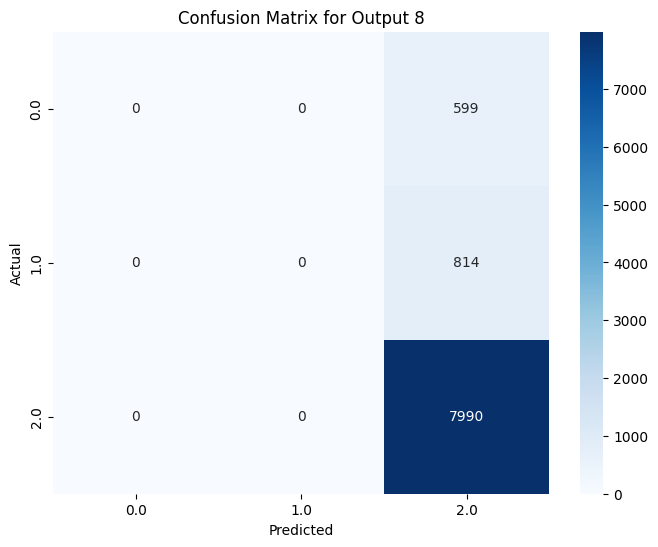

Hamming Loss for Output 8: 0.15

Classification Report for output 9:
              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96      8331
         1.0       0.67      0.55      0.61      1030
         2.0       0.57      0.10      0.16        42

    accuracy                           0.92      9403
   macro avg       0.73      0.54      0.58      9403
weighted avg       0.91      0.92      0.92      9403



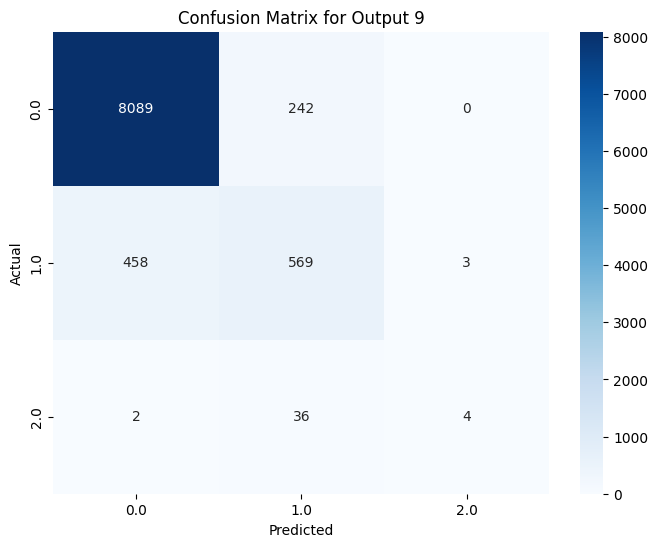

Hamming Loss for Output 9: 0.08

Classification Report for output 10:
              precision    recall  f1-score   support

         0.0       0.91      0.97      0.94      7954
         1.0       0.72      0.49      0.58      1419
         2.0       0.00      0.00      0.00        30

    accuracy                           0.89      9403
   macro avg       0.54      0.49      0.51      9403
weighted avg       0.88      0.89      0.88      9403



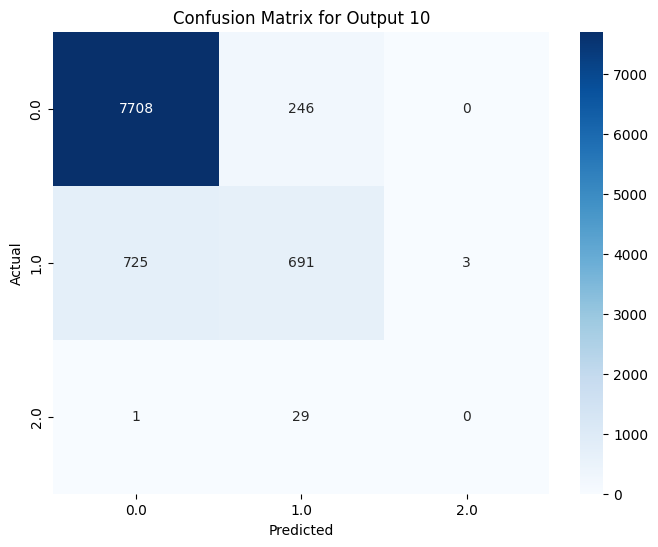

Hamming Loss for Output 10: 0.11

Classification Report for output 11:
              precision    recall  f1-score   support

         0.0       0.90      0.96      0.93      7772
         1.0       0.69      0.48      0.57      1596
         2.0       0.00      0.00      0.00        35

    accuracy                           0.87      9403
   macro avg       0.53      0.48      0.50      9403
weighted avg       0.86      0.87      0.86      9403



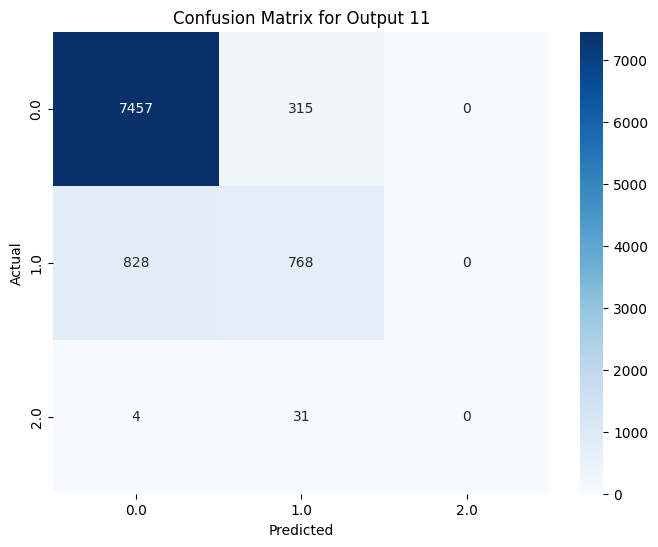

Hamming Loss for Output 11: 0.13


In [116]:
# Optional: Detailed classification report for each output
for i in range(y_binned.shape[1]):  # Using y_binned.shape instead of y.shape
    print(f"\nClassification Report for output {i+1}:")
    print(classification_report(y_test[:, i], y_pred[:, i], zero_division=0))

    # Plot confusion matrix
    cm = confusion_matrix(y_test[:, i], y_pred[:, i])
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=np.unique(y_binned[:, i]), yticklabels=np.unique(y_binned[:, i]))
    plt.title(f'Confusion Matrix for Output {i + 1}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Calculate Hamming Loss
    hamming = hamming_loss(y_test[:, i], y_pred[:, i])
    print(f"Hamming Loss for Output {i + 1}: {hamming:.2f}")

**Random Forests model**



In [117]:
from skimage.feature import hog
from skimage import io, color, transform
from sklearn.decomposition import IncrementalPCA
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, hamming_loss
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.multioutput import MultiOutputClassifier
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Assuming pca_result and kmeans_labels have been computed earlier in your workflow

# Combine reduced features with cluster labels
X_combined = np.hstack((pca_result, kmeans_labels.reshape(-1, 1)))
print("Combined features shape:", X_combined.shape)

# Example: Assuming y contains the continuous labels with the same number of samples as hog_features
y = np.array(dataframe_for_models)
print("Original y shape:", y.shape)

# Convert continuous outputs to discrete classes using binning
kb = KBinsDiscretizer(n_bins=11, encode='ordinal', strategy='uniform')
y_binned = kb.fit_transform(y)
y_binned = y_binned.astype(int)  # Convert to integer type for classifier
print("Binned y shape:", y_binned.shape)

# Extract the first column of y_binned for stratification
# This column should represent the class distribution for stratified splitting
stratify_col = y_binned[:, 0]

# Split the data using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_combined, y_binned, test_size=0.2, random_state=42, stratify=stratify_col
)

# Initialize the random forest classifier with class weighting
rf_classifier = RandomForestClassifier(random_state=42, n_estimators=100, class_weight='balanced')

# Wrap the classifier in a MultiOutputClassifier
multi_output_classifier = MultiOutputClassifier(rf_classifier)

# Train the classifier
multi_output_classifier.fit(X_train, y_train)

# Make predictions
y_pred = multi_output_classifier.predict(X_test)

Combined features shape: (47013, 51)
Original y shape: (47013, 11)
Binned y shape: (47013, 11)


In [119]:
# Print a detailed classification report for each output with zero_division handling
for i in range(y_test.shape[1]):
    print(f"\nClassification Report for output {i + 1}:")
    print(classification_report(y_test[:, i], y_pred[:, i], zero_division=0))


Classification Report for output 1:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1032
           1       1.00      1.00      1.00       634
           3       1.00      1.00      1.00       747
           4       1.00      0.98      0.99        88
           6       1.00      1.00      1.00      1289
           7       1.00      1.00      1.00       662
           9       1.00      1.00      1.00       787
          10       1.00      1.00      1.00      4164

    accuracy                           1.00      9403
   macro avg       1.00      1.00      1.00      9403
weighted avg       1.00      1.00      1.00      9403


Classification Report for output 2:
              precision    recall  f1-score   support

           0       0.80      1.00      0.89      7439
           1       0.49      0.03      0.05      1268
           2       0.00      0.00      0.00       495
           3       0.00      0.00      0.00       127
    

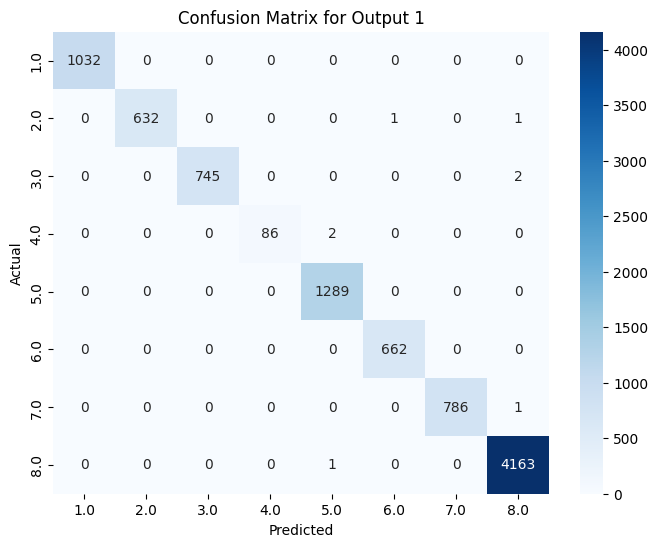

Hamming Loss for Output 1: 0.00


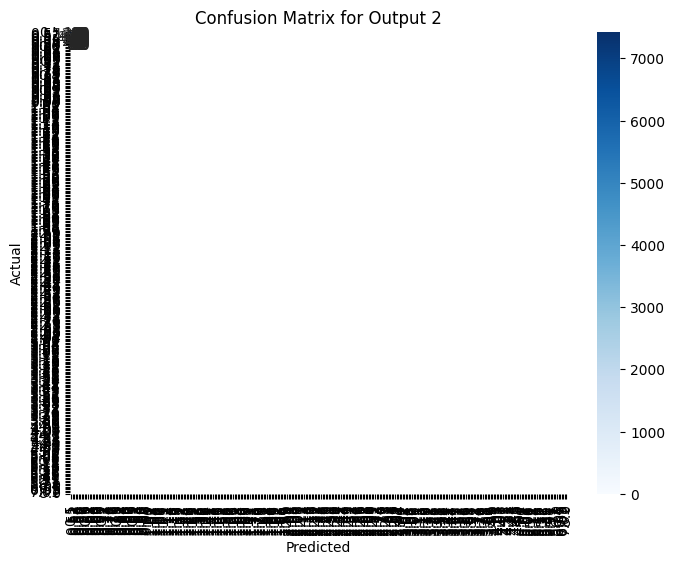

Hamming Loss for Output 2: 0.21


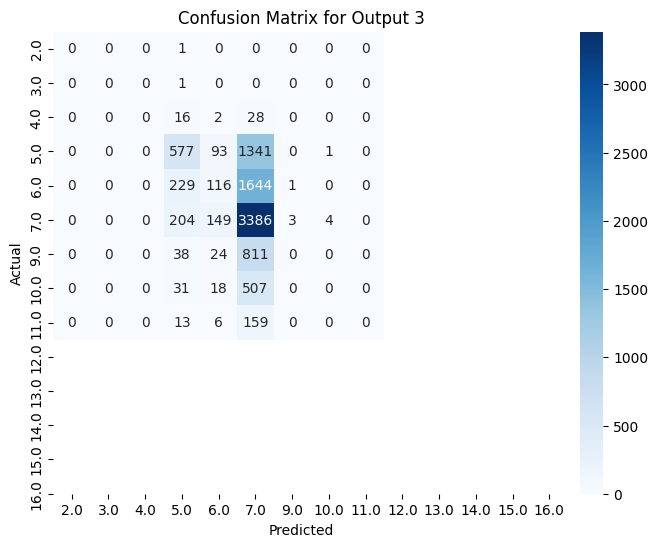

Hamming Loss for Output 3: 0.57


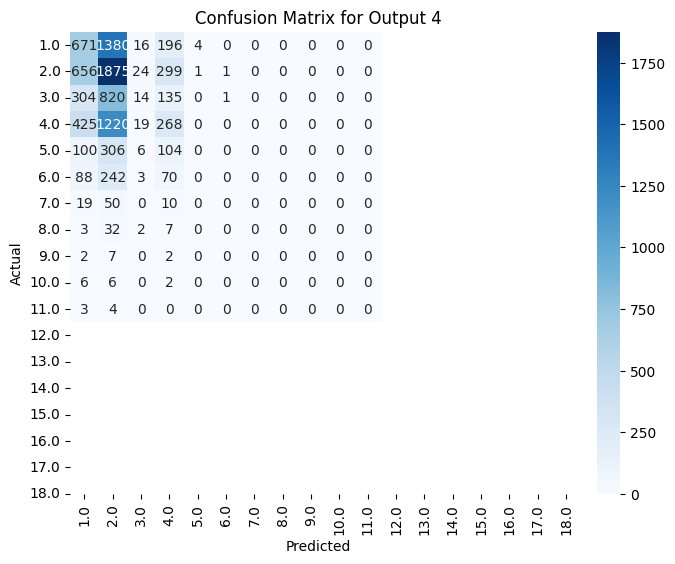

Hamming Loss for Output 4: 0.70


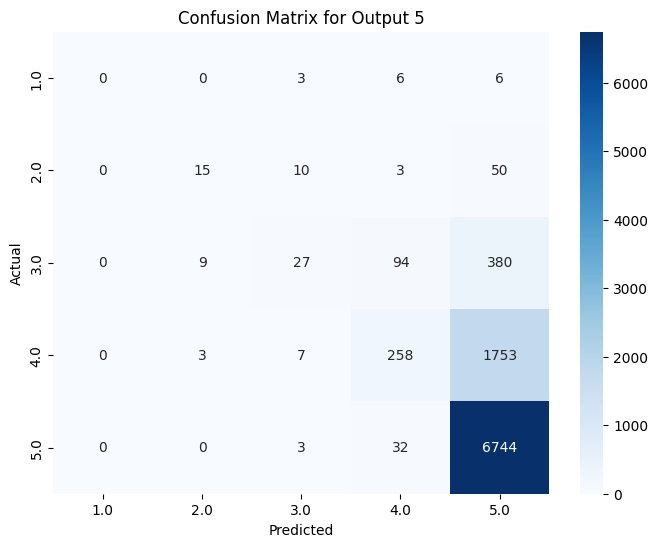

Hamming Loss for Output 5: 0.25


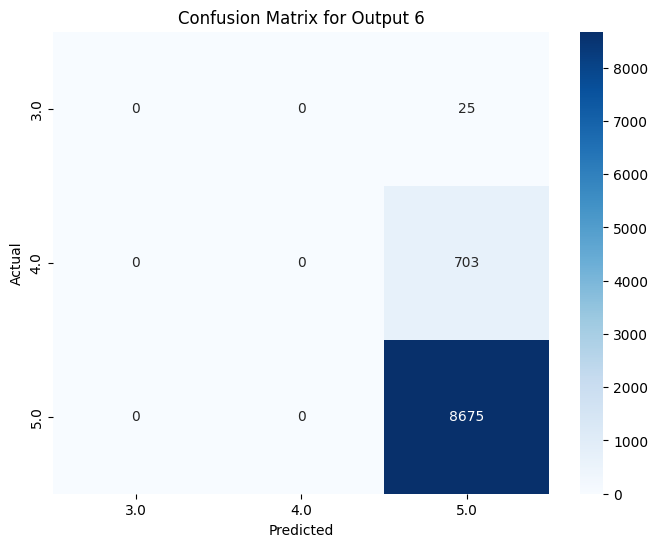

Hamming Loss for Output 6: 0.08


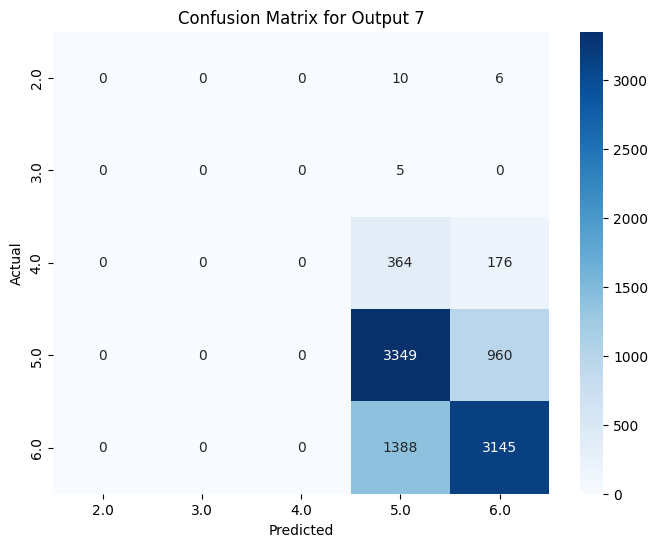

Hamming Loss for Output 7: 0.31


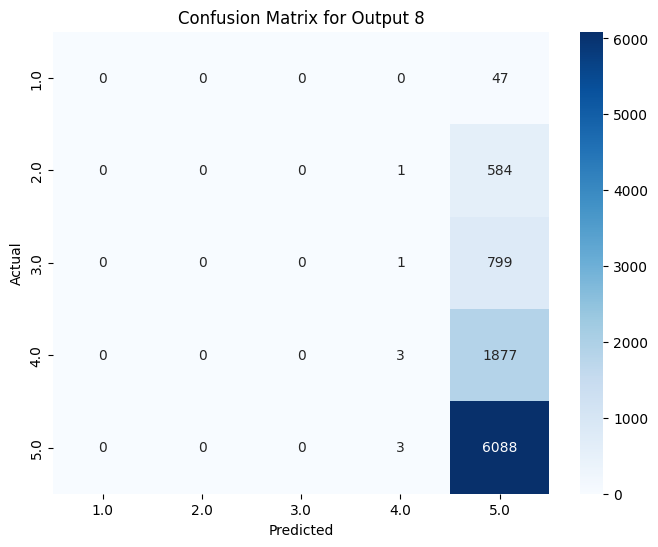

Hamming Loss for Output 8: 0.35


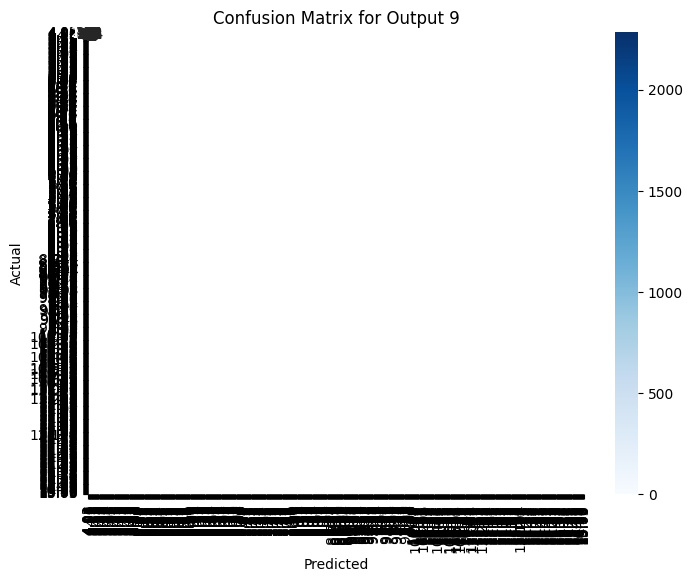

Hamming Loss for Output 9: 0.42


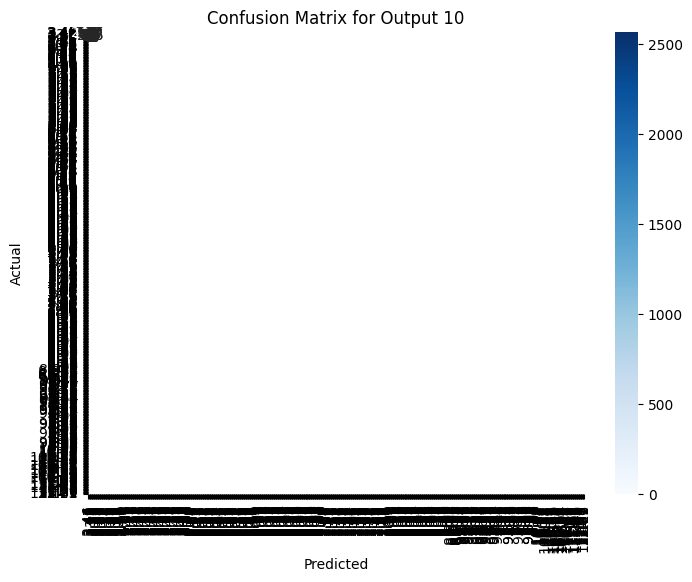

Hamming Loss for Output 10: 0.45


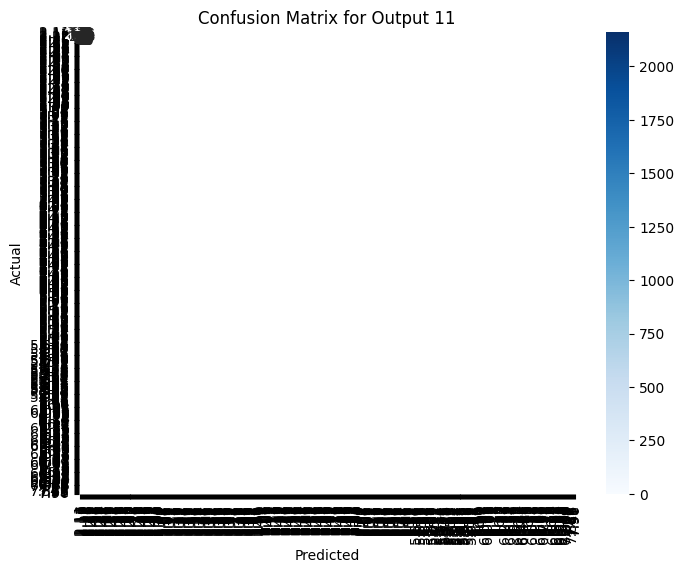

Hamming Loss for Output 11: 0.48


In [120]:
# Plot confusion matrix and calculate Hamming loss for each output
for i in range(y_test.shape[1]):
    # Compute confusion matrix
    cm = confusion_matrix(y_test[:, i], y_pred[:, i])
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=np.unique(y[:, i]), yticklabels=np.unique(y[:, i]))
    plt.title(f'Confusion Matrix for Output {i + 1}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Calculate Hamming Loss
    hamming = hamming_loss(y_test[:, i], y_pred[:, i])
    print(f"Hamming Loss for Output {i + 1}: {hamming:.2f}")

## Resizing and Normalization

Data Augmentation and Normalization: I used a series of image transformations from torchvision.transforms to preprocess the images. These transformations include resizing, converting to tensor, and normalizing the pixel values preparing the images for the CNN

In [121]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms, models
from torchvision.models import ResNet18_Weights
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
import numpy as np
from PIL import Image


In [122]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Handle the dataset images , prepare them for the model
The LabelEncoder from sklearn.preprocessing convert categorical string labels into numerical values. This is a preprocessing technique that converts categorical data into a form that can be provided to machine learning algorithms.
since the CNN expect to receive numerical values

In [123]:
class DiamondDataset(Dataset):
    def __init__(self, diamond_dataframe, transform=None):
        self.df = diamond_dataframe
        self.transform = transform
        
        # Initialize LabelEncoders for categorical labels
        self.label_encoders = {}
        for col in ['shape', 'clarity', 'colour', 'symmetry', 'fluorescence']:
            le = LabelEncoder()
            self.df[col] = le.fit_transform(self.df[col])
            self.label_encoders[col] = le

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_path = self.df.iloc[idx]['path_to_img']
        image = Image.open(image_path).convert('RGB') 
        labels = {
            'shape': self.df.iloc[idx]['shape'],
            'clarity': self.df.iloc[idx]['clarity'],
            'colour': self.df.iloc[idx]['colour'],
            'symmetry': self.df.iloc[idx]['symmetry'],
            'fluorescence': self.df.iloc[idx]['fluorescence'],
            'length': self.df.iloc[idx]['length'],
            'width': self.df.iloc[idx]['width'],
            'depth': self.df.iloc[idx]['depth']
        }
        if self.transform:
            image = self.transform(image)
        return image, labels

In [124]:
dataset = DiamondDataset(dataframe, transform=transform)

dividing the dataset to training set and validation set

In [125]:
# Uncomment and use the original lines for splitting the full dataset:
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

defining the model to use pre trained resnet18 CNN. 
I used a pre-trained ResNet-18 model from torchvision.models as the base model. ResNet-18 is a type of convolutional neural network (CNN) that is particularly effective for image classification tasks due to its residual learning framework.

In [126]:
class DiamondMultiOutputModel(nn.Module):
    def __init__(self, num_classes_dict):
        super().__init__()
        self.base_model = models.resnet18(weights=ResNet18_Weights.DEFAULT)
        num_ftrs = self.base_model.fc.in_features
        self.base_model.fc = nn.Identity()

        self.output_heads = nn.ModuleDict({
            task: nn.Sequential(
                nn.Flatten(), 
                nn.Linear(num_ftrs, 128),
                nn.ReLU(),
                nn.Dropout(0.5),
                nn.Linear(128, num_classes)
            ) for task, num_classes in num_classes_dict.items()
        })

    def forward(self, x):
        features = self.base_model(x)
        return {task: head(features) for task, head in self.output_heads.items()}

Multi-Output Neural Network: I modified the ResNet-18 model to create a multi-output model by replacing its fully connected layer with multiple task-specific output heads. Each output head is a small neural network responsible for predicting a specific attribute of the diamond.

In [127]:
num_classes_dict = {
    'shape': len(dataset.df['shape'].unique()),
    'clarity': len(dataset.df['clarity'].unique()),
    'colour': len(dataset.df['colour'].unique()),
    'symmetry': len(dataset.df['symmetry'].unique()),
    'fluorescence': len(dataset.df['fluorescence'].unique()),
    'length': 1,  
    'width': 1,   
    'depth': 1    
}

criterion_dict = {
    'shape': nn.CrossEntropyLoss(),
    'clarity': nn.CrossEntropyLoss(),
    'colour': nn.CrossEntropyLoss(),
    'symmetry': nn.CrossEntropyLoss(),
    'fluorescence': nn.CrossEntropyLoss(),
    'length': nn.MSELoss(),
    'width': nn.MSELoss(),
    'depth': nn.MSELoss()
}

allocating resorces for the model for the training, either CPU or GPU

In [128]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # Use GPU if available

In [129]:
import torch
print(torch.cuda.is_available())

True


creating the model and setting an optimizer to assist with the gradient dicent problem
Adam Optimizer: I used the Adam optimizer (torch.optim.Adam) to train the neural network. Adam is an adaptive learning rate optimization algorithm that is widely used in training deep learning models because it combines the benefits of two other extensions of stochastic gradient descent (SGD), specifically AdaGrad and RMSProp.

In [130]:
model = DiamondMultiOutputModel(num_classes_dict)
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [131]:
# Initialize lists to track losses and accuracies
train_losses = []
val_losses = []
train_accuracies = {task: [] for task in num_classes_dict.keys()}
val_accuracies = {task: [] for task in num_classes_dict.keys()}
def calculate_accuracy(outputs, labels):
    _, preds = torch.max(outputs, 1)
    return torch.sum(preds == labels).item() / len(labels)

the actual training, 10 epochs devided to batch since the dataset is large

In [132]:
for epoch in range(10):
    model.train()
    running_loss = 0.0
    correct_preds = {task: 0 for task in num_classes_dict.keys()}
    total_preds = 0

    # Use tqdm for training loop progress bar
    train_loop = tqdm(train_loader, desc=f'Epoch [{epoch+1}/10] (Training)')
    for batch_idx, (images, labels) in enumerate(train_loop):
        images = images.to(device)
        labels = {k: v.clone().detach().to(device, dtype=torch.long) for k, v in labels.items()}

        optimizer.zero_grad()
        outputs = model(images)

        # Calculate loss for each task
        loss = sum([criterion_dict[task](
            outputs[task], 
            labels[task].float().unsqueeze(1) if task in ['length', 'width', 'depth'] else labels[task]
        ) for task in outputs])

        loss.backward()
        optimizer.step()

        # Update running loss for display in tqdm
        running_loss += loss.item()
        train_loop.set_postfix(loss=running_loss/len(train_loader))
        
        # Calculate accuracy
        for task in outputs.keys():
            if task in ['length', 'width', 'depth']:
                continue  # Skip regression tasks for accuracy calculation
            correct_preds[task] += calculate_accuracy(outputs[task], labels[task])
        total_preds += len(images)
    train_losses.append(running_loss/len(train_loader))
    for task in correct_preds.keys():
        train_accuracies[task].append(correct_preds[task] / total_preds)

    # Validation loop
    model.eval()
    val_loss = 0.0
    correct_preds = {task: 0 for task in num_classes_dict.keys()}
    
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f'Epoch [{epoch+1}/10] (Validation)'):
            images = images.to(device)
            labels = {k: v.clone().detach().to(device, dtype=torch.long) for k, v in labels.items()}
            outputs = model(images)
            val_loss += sum([criterion_dict[task](outputs[task], labels[task].float().unsqueeze(1) if task in ['length', 'width', 'depth'] else labels[task]) for task in outputs]).item()
            # Calculate accuracy
            for task in outputs.keys():
                if task in ['length', 'width', 'depth']:
                    continue  # Skip regression tasks for accuracy calculation
                correct_preds[task] += calculate_accuracy(outputs[task], labels[task])
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    for task in correct_preds.keys():
        val_accuracies[task].append(correct_preds[task] / len(val_loader))
        
    print(f'Epoch [{epoch+1}/10], Val Loss: {val_loss:.4f}')

torch.save(model.state_dict(), 'diamond_model.pth')

Epoch [1/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [03:25<00:00,  1.43it/s]


Epoch [1/10], Val Loss: 6.3812


Epoch [2/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [01:47<00:00,  2.75it/s]


Epoch [2/10], Val Loss: 6.3034


Epoch [3/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [01:44<00:00,  2.82it/s]


Epoch [3/10], Val Loss: 5.3631


Epoch [4/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [01:43<00:00,  2.83it/s]


Epoch [4/10], Val Loss: 5.8837


Epoch [5/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [01:44<00:00,  2.83it/s]


Epoch [5/10], Val Loss: 6.8639


Epoch [6/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [01:43<00:00,  2.83it/s]


Epoch [6/10], Val Loss: 5.2469


Epoch [7/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [01:49<00:00,  2.70it/s]


Epoch [7/10], Val Loss: 5.2033


Epoch [8/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [01:44<00:00,  2.80it/s]


Epoch [8/10], Val Loss: 5.7575


Epoch [9/10] (Validation): 100%|█████████████████████████████████████████████████████| 294/294 [01:42<00:00,  2.85it/s]


Epoch [9/10], Val Loss: 5.2291


Epoch [10/10] (Validation): 100%|████████████████████████████████████████████████████| 294/294 [01:44<00:00,  2.83it/s]

Epoch [10/10], Val Loss: 12.5281


I assess the model perfomance by the loss and accuracy metrics

In [134]:
# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot the accuracies for each task
for task in train_accuracies.keys():
     if task in ['carat', 'length', 'width', 'depth']:
        continue  # Skip regression tasks for plotting
    plt.figure(figsize=(10, 5))
    plt.plot(train_accuracies[task], label=f'Training Accuracy - {task}')
    plt.plot(val_accuracies[task], label=f'Validation Accuracy - {task}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(f'Training and Validation Accuracy for {task}')
    plt.legend()
    plt.show()

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot the accuracies for each task
for task in train_accuracies.keys():
    plt.figure(figsize=(10, 5))
    plt.plot(train_accuracies[task], label=f'Training Accuracy - {task}')
    plt.plot(val_accuracies[task], label=f'Validation Accuracy - {task}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(f'Training and Validation Accuracy for {task}')
    plt.legend()
    plt.show()

IndentationError: unindent does not match any outer indentation level (<string>, line 15)

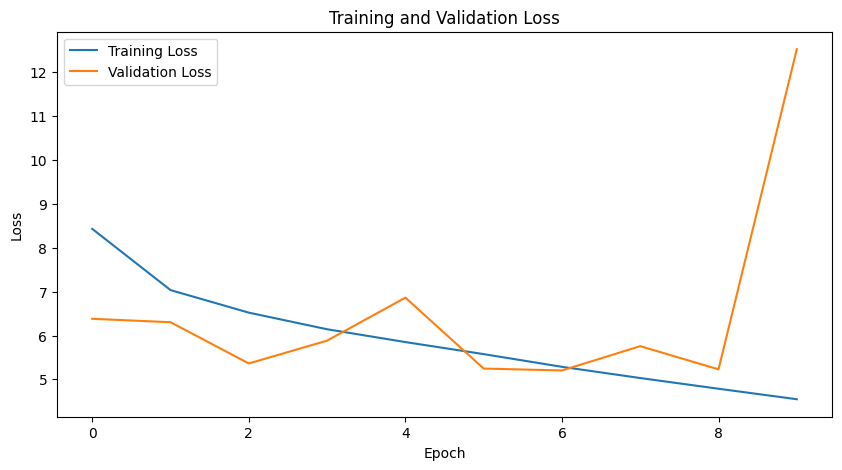

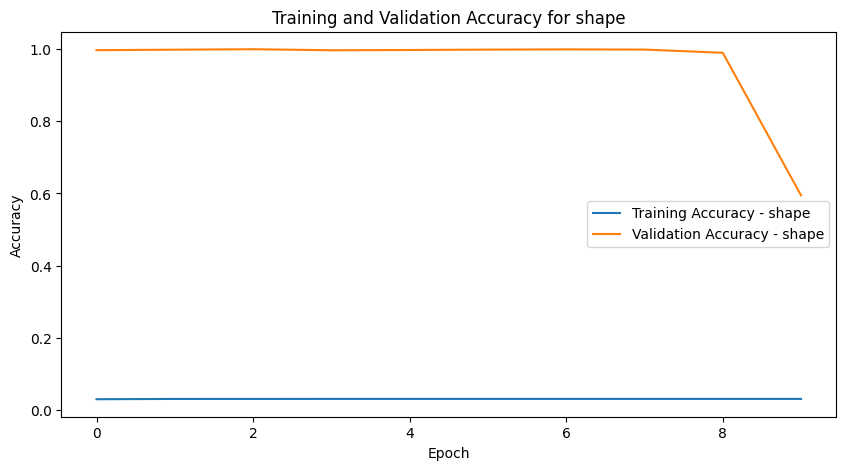

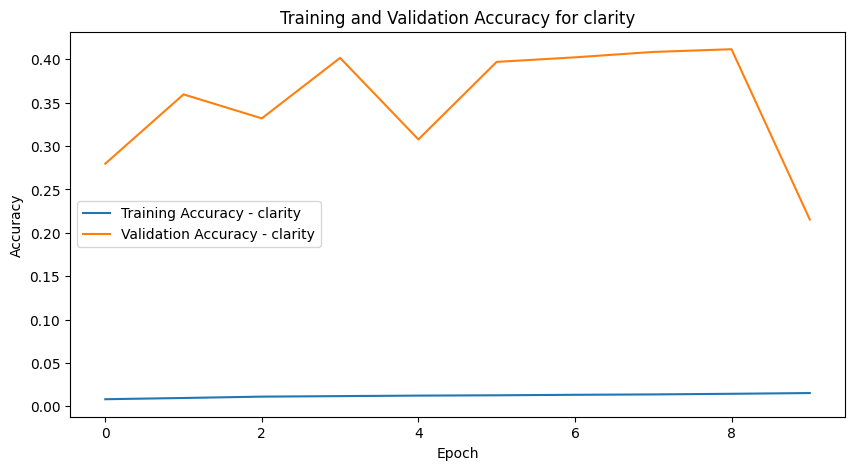

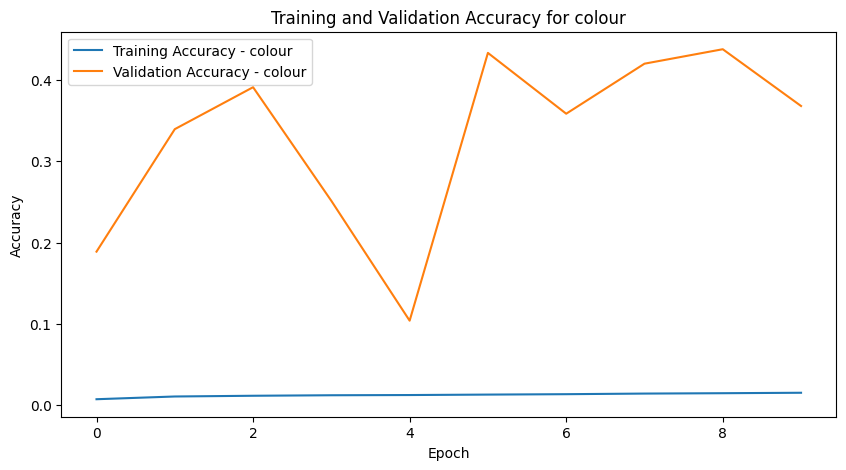

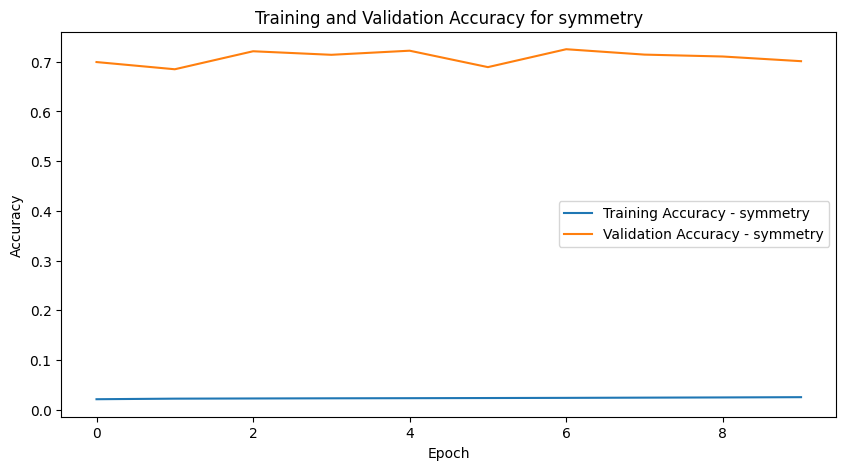

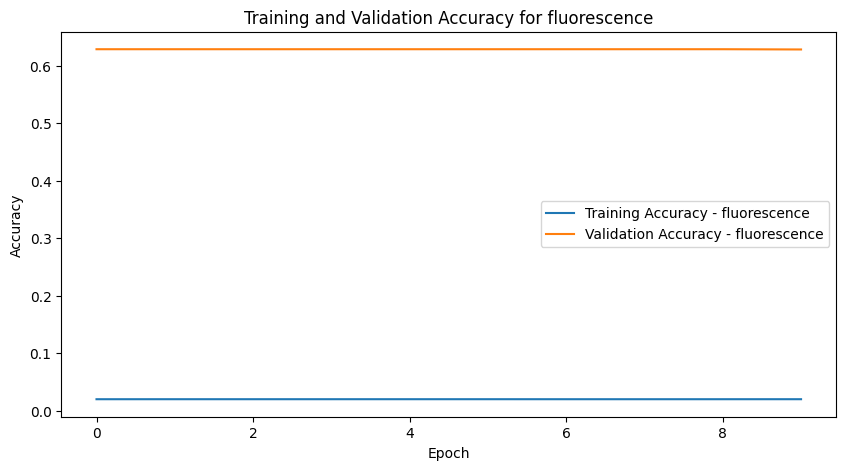

In [135]:
import matplotlib.pyplot as plt

# Assuming `train_losses`, `val_losses`, `train_accuracies`, and `val_accuracies` are defined

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot the accuracies for each task
for task in train_accuracies.keys():
    if task in ['carat', 'length', 'width', 'depth']:
        continue  # Skip regression tasks for plotting
    plt.figure(figsize=(10, 5))
    plt.plot(train_accuracies[task], label=f'Training Accuracy - {task}')
    plt.plot(val_accuracies[task], label=f'Validation Accuracy - {task}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(f'Training and Validation Accuracy for {task}')
    plt.legend()
    plt.show()


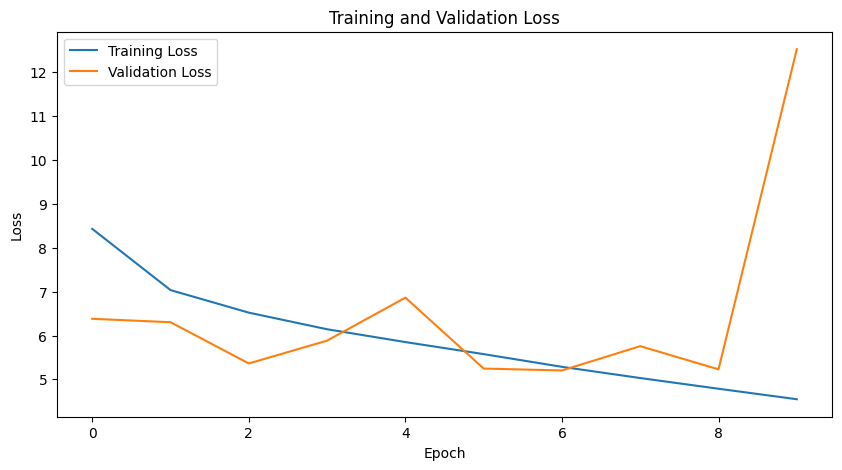

In [138]:
import matplotlib.pyplot as plt

# Assuming `train_losses`, `val_losses`, `train_accuracies`, and `val_accuracies` are defined

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

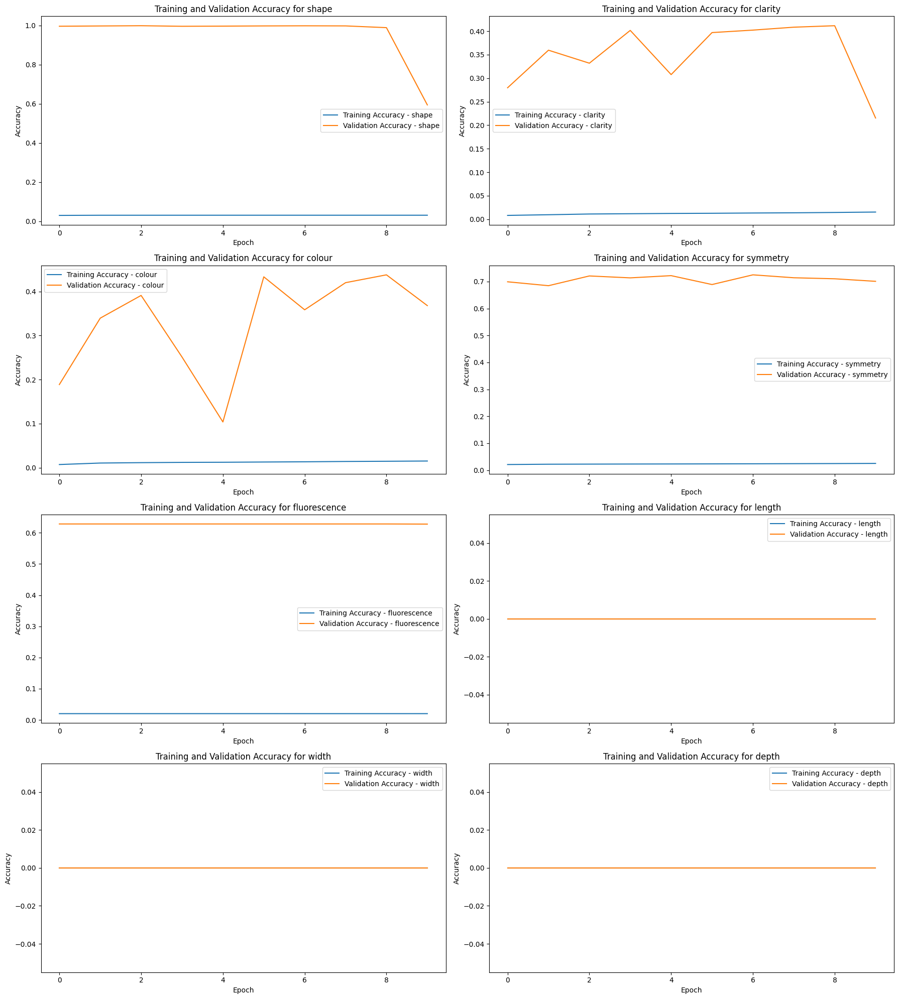

In [145]:
import matplotlib.pyplot as plt

# Assuming `train_losses`, `val_losses`, `train_accuracies`, and `val_accuracies` are defined

# Create a figure and subplots
fig, axes = plt.subplots(4, 2, figsize=(18, 20))  # 1 row, 3 columns

# Plot the accuracies for each task, one plot per task (example: first two classification tasks)
tasks = ['shape', 'clarity', 'colour', 'symmetry', 'fluorescence', 'length', 'width', 'depth']  # Replace with the actual task names you want to plot
n_cols = 2
for i, task in enumerate(tasks):
    axes[int(i/n_cols), i%n_cols].plot(train_accuracies[task], label=f'Training Accuracy - {task}')
    axes[int(i/n_cols), i%n_cols].plot(val_accuracies[task], label=f'Validation Accuracy - {task}')
    axes[int(i/n_cols), i%n_cols].set_xlabel('Epoch')
    axes[int(i/n_cols), i%n_cols].set_ylabel('Accuracy')
    axes[int(i/n_cols), i%n_cols].set_title(f'Training and Validation Accuracy for {task}')
    axes[int(i/n_cols), i%n_cols].legend()

# Adjust layout
plt.tight_layout()
plt.show()


as we can see, there is good decent of the loss parameter but the other scales are far from the validation.

In [148]:
from sklearn.calibration import LabelEncoder
import torch.nn.functional as F  

# Load the trained model
model_path = 'diamond_model.pth'

# Load the dataset (only to get unique values for label encoding)
dataset = DiamondDataset(diamond_dataframe = dataframe, transform=None)

# Calculate num_classes_dict dynamically (same as in train.py)
num_classes_dict = {
    'shape': len(dataset.df['shape'].unique()),
    'clarity': len(dataset.df['clarity'].unique()),
    'colour': len(dataset.df['colour'].unique()),
    'symmetry': len(dataset.df['symmetry'].unique()),
    'fluorescence': len(dataset.df['fluorescence'].unique()),
    'length': 1,
    'width': 1,
    'depth': 1
}

In [149]:
model = DiamondMultiOutputModel(num_classes_dict)
model.load_state_dict(torch.load(model_path))
model.eval()  # Set the model to evaluation mode

DiamondMultiOutputModel(
  (base_model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, aff

In [150]:
# Preprocessing for new images
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [151]:
# Function to decode predictions
def decode_predictions(outputs, dataset_csv_file='web_scraped/diamond_data.csv'):
    decoded_labels = {}
    df = pd.read_csv(dataset_csv_file)
    for task, output in outputs.items():
        if task in ['carat', 'length', 'width', 'depth']:
            decoded_labels[task] = output.item()  # Continuous value
        else:
            probabilities = F.softmax(output, dim=1) 
            top_prob, top_idx = torch.topk(probabilities, 1)
            predicted_label = list(df[task].unique())[top_idx.item()]
            probability_percent = round(top_prob.item() * 100, 2)  # Use round() function
            decoded_labels[task] = (predicted_label, probability_percent)
    return decoded_labels

and a good solution is a successful recognition of a diamond, and its features

In [152]:
image_path = "web_scraped/emerald/214125-54.jpg"

# Load and preprocess the image
image = Image.open(image_path).convert('RGB')  # Ensure RGB format
image = transform(image).unsqueeze(0) 

# Make prediction
with torch.no_grad():  # No gradients needed for inference
    outputs = model(image)

# Decode predictions
predicted_labels = decode_predictions(outputs)

# Print the predicted labels
print("Predicted Diamond Attributes:")
for attribute, value in predicted_labels.items():
    if isinstance(value, tuple):  # Categorical attribute with probability
        print(f"{attribute.capitalize()}: {value[0]} (Probability: {value[1]}%)")
    else:  # Continuous attribute
        print(f"{attribute.capitalize()}: {value}")


Predicted Diamond Attributes:
Shape: emerald (Probability: 99.4%)
Clarity: I1 (Probability: 84.27%)
Colour: K (Probability: 39.73%)
Symmetry: VG (Probability: 58.42%)
Fluorescence: ST (Probability: 70.0%)
Length: 6.893984317779541
Width: 5.772992134094238
Depth: 3.612881660461426


Actual Diamond Attributes:
Shape: emerald 
Clarity: SI2
Colour: H 
Symmetry: EX
Fluorescence: N 
Length: 7.74
Width: 5.71
Depth: 3.91

as we can see there is a lack of match between the prediction and the actual data.

I intend to improve the data augmentation by adding more techniques, and adding Confusion Matrix for classification tasks and Regression Plots for regression tasks.
and i want to Implement cross-validation with a different data subsets.
i should experiment with different hyperparameters (learning rate, batch size, number of epochs)